# **SLAP 2 Oddball contextual modulation of synaptic responses analysis**

In [ ]:
!rm -rf /content/oddball_traces/DMD2/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


building on code by Jérôme Lecoq:
https://allenneuraldynamics.github.io/openscope-community-predictive-processing/pilotanalysis/

and Carter Peene:
https://allenneuraldynamics.github.io/openscope-community-predictive-processing/notebooks/pilot_analysis_rfs/

and Alex Maeier: https://colab.research.google.com/drive/17-pAT6-xZXFM5mz3ccUt1W7w3Yaxazh7?usp=sharing

## SLAP 2 PILOT EXPERIMENT

Notes: https://allenneuraldynamics.github.io/openscope-community-predictive-processing/experiments/allen_institute/slap2/allen_institute_794237_2025-05-08/

Glutamate imaging, 50 min
[iGluSnFR4 labels the entire membrane, and reports extracellular glutamate. However, it turns out that this is quite specific to synaptic partners, because glutamate is buffered and taken up at each synapse by glia. We do not measure receptor activation. The glutamate signals seem specific because:

*   when axons are labeled, the signals are highly correlated to the spiking of the cell

*   signals occur preferentially at the tips of spines

*   modeling the process of glutamate and release and diffusion, with known AMPA and NMDA receptor activations to guide the models, using molecular diffusion models.]

Subject ID: 794237

Date: 2025-05-08

Experimenters: @Seyedolmohadesin @rcpeene @jeromelecoq @amshelton

Stimulus: Standard Oddball [523741b57359b8ad4ca7963611473fbb195ad010](https://github.com/AllenNeuralDynamics/openscope-community-predictive-processing/blob/523741b57359b8ad4ca7963611473fbb195ad010/code/stimulus-control/src/Standard_oddball_slap2.bonsai)


Each ROI is a single synapse.

There are 2 planes: One apical and one proximal dendrite.
One plane is deep at the somatic layers and the other is very superficial. Roughly, you one plane was in  layer I and the other in layers 2/3

X,Y location of each ROI is center of mass.

3 behavior videos (eye, face, body); HARP timestamps aligned with other events.

Baseline: 2405 -> NbBaselineGrating * (1 * (0.343+0.343)) -> 27.49 min

Mismatch: 40 -> NbMismatchPerCondition * 4 * (0.343+0.343)) -> 1.829 min of oddballs

Mismatch during orientation tuning: 40 -> 14.63 min

Receptive field: 10 -> NbReceptiveFieldRepeats * ((0.25) * 149) -> 6.2 min of RF
Total Expected duration = 50.16 min Oddball occurs on average every 11s

Head fixation started at 13:55

14:25: aligned camera.

Experiment started at about 2;50.

Apical dendrites is imaged in DMD2.

Ended at 3:42

## Import Dependencies

In [ ]:
!pip install black[jupyter] --quiet
from google.colab import drive

!pip install pynwb
!pip install dandi
!pip install tqdm
!pip install requests

from pathlib import Path
from pynwb import NWBHDF5IO
import numpy as np
import matplotlib.pyplot as plt
from dandi import dandiapi
import os
import requests
from tqdm import tqdm

### set paths

In [ ]:
from pathlib import Path

output_dir = Path("/content")
output_dir.mkdir(exist_ok=True)
#drive.mount("/content/drive")

### Format code
Use black to format code. Refresh page before saving to load the changes and then save!

In [ ]:
!black /content/drive/MyDrive/'Colab Notebooks'/'SLAP2_Oddballs_with_controls.ipynb'

Usage: black [OPTIONS] SRC ...
Try 'black -h' for help.

Error: Invalid value for 'SRC ...': Path '/content/drive/MyDrive/Colab Notebooks/SLAP2_Oddballs_with_controls.ipynb' does not exist.


## Download and Open NWB file

Experiment: https://allenneuraldynamics.github.io/openscope-community-predictive-processing/experiments/allen_institute/slap2/allen_institute_794237_2025-05-08/

The NWB files are from Dandiset 001424 on DANDI.


In [ ]:
dandiset_id = "001424"
dandi_filepath = "sub-794237/sub-794237_ses-20250508T145040_image+ophys.nwb" #3
#dandi_filepath = "sub-794237/sub-794237_ses-20250403T103830_image+ophys.nwb"  #1_notworking
#dandi_filepath ="sub-794237/sub-794237_ses-20250424T142019_image+ophys.nwb"  #2
filename = dandi_filepath.split("/")[-1]
filepath = output_dir / filename

**download file**

In [ ]:
if filepath.exists():
    print(f"{filename} already exists.")
else:
    client = dandiapi.DandiAPIClient()
    dandiset = client.get_dandiset(dandiset_id)
    file = dandiset.get_asset_by_path(dandi_filepath)
    file_url = file.download_url

    # Stream download
    response = requests.get(file_url, stream=True)
    total_size = int(response.headers.get("content-length", 0))
    block_size = 1024  # 1 Kibibyte

    with open(filepath, "wb") as f, tqdm(
        desc=f"Downloading {filename}",
        total=total_size,
        unit="iB",
        unit_scale=True,
        unit_divisor=1024,
    ) as bar:
        for data in response.iter_content(block_size):
            f.write(data)
            bar.update(len(data))

    print(f"Downloaded file to {filepath}")

sub-794237_ses-20250508T145040_image+ophys.nwb already exists.


**open file**

In [ ]:
import warnings
from pynwb import NWBHDF5IO

with warnings.catch_warnings():
    warnings.filterwarnings(
        "ignore",
        category=UserWarning,
        message=".*Date is missing timezone information.*",
    )
    io = NWBHDF5IO(filepath, mode="r", load_namespaces=True)
    nwb = io.read()

Here are the NWB sections: The most important sections are `intervals` which contains the stimulus information, and `processing` which contains the pre-processed ophys data (synaptic fluorescence traces and plane mappings.)

In [ ]:
nwb

Data type,float64
Shape,"(1, 323, 832)"
Array size,2.05 MiB
Chunk shape,None
Compression,None
Compression opts,None
Compression ratio,1.0
Data type,float64
Shape,"(1,)"
Array size,8.00 bytes
Chunk shape,None


## Examining the Stimulus Structure

Shown here is the stimulus table, which includes the parameterized stimulus information over time. In these experiments, the type of stimulus 'epoch' is not recorded. All stimuli are drifting gratings, where each row is one drifting grating.

We have 4 blocks:

*   Orientation tuning : The orientation is being changed a lot.

*   Oddball block : The orientation does not change except for rare oddballs.

*   Orientation tuning : Same as before.

*   Finally, the Receptive block: Both the orientation and the location of a 20 degree drifting grating changes.

In [ ]:
nwb.intervals.keys()

stim_table_name = "stimulus_presentations"
stim_table = nwb.intervals[stim_table_name].to_dataframe()
stim_table[:10]

,start_time,stop_time,orientation,trial,delay,diameter,x_position,y_position,contrast,spatial_frequency,temporal_frequency
id,,,,,,,,,,,
0,5.150016,5.493016,1.178097,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
1,5.849984,6.192984,0.392699,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
2,6.549984,6.892984,1.963495,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
3,7.249984,7.592984,3.926991,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
4,7.949984,8.292984,2.356194,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
5,8.649984,8.992984,0.000000,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
6,9.349984,9.692984,4.712389,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
7,10.049984,10.392984,5.497787,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0
8,10.749984,11.092984,0.392699,1.0,0.343,360.0,0.0,0.0,1.0,0.04,2.0



## Oddball Analysis with control comparison

Oddball responses for each synapse ROI in the recording. Because there are so many, they will be saved as PNGs rather than plotted in the notebook.

An important difference to the previous analysis is that in order to compare oddballs to the random control, the z-score is computed either for the entire first half of the experiment, or the second half, each comprising 20 trials of controls and oddballs for each deviant. Comparing two halfs separately still allows to a small extent to compensate for bleaching, and allows to compare direction responses pre- and post the oddball session.

### Analysis functions

In [ ]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict





def get_z_score_mean_and_std(dff, timestamps, stim_table, common_indices, baseline_duration):
    """
    Computes the mean and standard deviation of the baseline period across
    all trials of control 1, oddball, and control 2 conditions in a vectorized way.

    Args:
        dff (np.array): The delta F/F data for all ROIs (time_points, num_rois).
        timestamps (np.array): The timestamps corresponding to the dff data.
        stim_table (pd.DataFrame): The stimulus presentations table.
        common_indices (list): List of indices for control 1, control 2 and oddball trials in stim_table.
        baseline_duration (float): Duration of the baseline period before stimulus onset.

    Returns:
        tuple: (mean_baseline, std_baseline) across all specified trials and baseline periods.
               mean_baseline and std_baseline will be numpy arrays of shape (num_rois,).
    """

    # Extract baseline responses for all ROIs simultaneously
    all_baseline_responses = []
    for index in common_indices:
        row = stim_table.iloc[index]
        start_time = row["start_time"]
        idx_start, idx_end = np.searchsorted(
            timestamps, (start_time - baseline_duration, start_time)
        )
        # Append the baseline responses for all ROIs in this trial
        all_baseline_responses.append(dff[idx_start:idx_end, :])

    if not all_baseline_responses:
        print("No baseline responses found for the given indices and duration.")
        # Return appropriate shape arrays with NaN values if no data
        if dff.shape[1] > 0:
             return np.full(dff.shape[1], np.nan), np.full(dff.shape[1], np.nan)
        else:
             return np.nan, np.nan

    # Concatenate responses across all trials and time points within the baseline
    # The shape will be (total_baseline_time_points, num_rois)
    all_baseline_responses_concatenated = np.concatenate(all_baseline_responses, axis=0)

    # Compute the mean and standard deviation across the first axis (time points)
    # This will result in arrays of shape (num_rois,)
    mean_baseline = np.nanmean(all_baseline_responses_concatenated, axis=0)
    std_baseline = np.nanstd(all_baseline_responses_concatenated, axis=0)

    return mean_baseline, std_baseline


def get_z_scored_response(dff, idx_start, idx_end, baseline_mean, baseline_std):
    z_scored_response = (dff[idx_start:idx_end] - baseline_mean) / (baseline_std + 1e-10)
    return z_scored_response





def get_common_mean_and_std(dff, indices):
    responses = dff[indices]
    mean = np.nanmean(responses, axis=0)
    std = np.nanstd(responses, axis=0)
    return mean, std


def get_orientation_oddball_z_scored_response_dict(
    dff,
    timestamps,
    stim_table,
    indices,
    common_indices,
    trace_len,
    onset_delay,
    window_duration,
    baseline_duration,
    get_all_standard=False,
):
    baseline_mean, baseline_std = get_z_score_mean_and_std(
        dff, timestamps, stim_table, common_indices, baseline_duration
    )  # z score is computed with respect to common mean and std to enable comparability

    z_scored_response_dict = defaultdict(lambda: defaultdict(list))

    for index in indices:
        row = stim_table.iloc[index]
        orientation = row["orientation_deg"]

        if get_all_standard:
          if orientation == 45 or orientation == 90 or orientation == 0:
            # Extract response for any orientation
            start_time = row["start_time"]
            idx_start, idx_end = np.searchsorted(
                timestamps,
                (start_time - baseline_duration, start_time + window_duration),
            )
            z_scored_response = get_z_scored_response(
                dff, idx_start, idx_end, baseline_mean, baseline_std
            )
            if (
                z_scored_response is not None
                and z_scored_response.shape[0] == trace_len
            ):
                key = str(orientation)
                z_scored_response_dict[key]["z_scored_traces"].append(z_scored_response)
                z_scored_response_dict[key]["trial_idx"].append(index)  #  trial index

        else:
            if orientation == 45 or orientation == 90:
                # Oddball
                start_time = row["start_time"]
                idx_start, idx_end = np.searchsorted(
                    timestamps,
                    (start_time - baseline_duration, start_time + window_duration),
                )
                z_scored_response = get_z_scored_response(
                    dff, idx_start, idx_end, baseline_mean, baseline_std
                )
                if (
                    z_scored_response is not None
                    and z_scored_response.shape[0] == trace_len
                ):
                    key = str(orientation)
                    z_scored_response_dict[key]["z_scored_traces"].append(z_scored_response)
                    z_scored_response_dict[key]["trial_idx"].append(index)  #  trial index

                # Subsample standard before 45 oddball
                if orientation == 45:
                    row = stim_table.iloc[index - 1]
                    orientation = row["orientation_deg"]
                    if orientation == 0:
                        start_time = row["start_time"]
                        idx_start, idx_end = np.searchsorted(
                            timestamps,
                            (start_time - baseline_duration, start_time + window_duration),
                        )
                        z_scored_response = get_z_scored_response(
                            dff, idx_start, idx_end, baseline_mean, baseline_std
                        )
                        if (
                            z_scored_response is not None
                            and z_scored_response.shape[0] == trace_len
                        ):
                            key = str(orientation)
                            z_scored_response_dict[key]["z_scored_traces"].append(z_scored_response)
                            z_scored_response_dict[key]["trial_idx"].append(index - 1)

    return z_scored_response_dict


def get_control_z_scored_response_dict(
    dff,
    timestamps,
    stim_table,
    indices,
    common_indices,
    trace_len,
    onset_delay,
    window_duration,
    baseline_duration,
):
    common_mean, common_std = get_common_mean_and_std(
        dff, common_indices
    )  # z score is computed with respect to common mean and std to enable comparability
    z_scored_response_dict = defaultdict(lambda: defaultdict(list))
    for index in indices:
        row = stim_table.iloc[index]
        # Extract response in the given window
        start_time = row["start_time"]
        idx_start, idx_end = np.searchsorted(
            timestamps, (start_time - baseline_duration, start_time + window_duration)
        )
        z_scored_response = get_z_scored_response(
            dff, idx_start, idx_end, common_mean, common_std
        )
        if z_scored_response is not None and z_scored_response.shape[0] == trace_len:
            z_scored_response_dict[str(row["orientation_deg"])][
                "z_scored_traces"
            ].append(z_scored_response)
    return z_scored_response_dict


def extract_orientation_oddball_and_control_responses(
    dff,
    timestamps,
    stim_table,
    control_indices,
    oddball_indices,
    onset_delay = 0.0,
    window_duration = 0.5,
    baseline_duration = 0.2,
):
    sampling_interval = np.median(np.diff(timestamps))
    trace_len = int(np.round((baseline_duration + window_duration) / sampling_interval))
    trace_window = np.linspace(-baseline_duration, window_duration, trace_len)
    oddball_responses = defaultdict(lambda: defaultdict(list))
    control_responses = defaultdict(lambda: defaultdict(list))
    common_indices = np.append(
        oddball_indices, control_indices
    )  # common indices to compute z score with common median and std
    control_responses = get_control_z_scored_response_dict(
        dff,
        timestamps,
        stim_table,
        control_indices,
        common_indices,
        trace_len,
        onset_delay,
        window_duration,
        baseline_duration,
    )
    oddball_responses = get_orientation_oddball_z_scored_response_dict(
        dff,
        timestamps,
        stim_table,
        oddball_indices,
        common_indices,
        trace_len,
        onset_delay,
        window_duration,
        baseline_duration,
    )
    return control_responses, oddball_responses, trace_window

### Analysis parameters

In [ ]:
stim_table["orientation_deg"] = (
    (np.degrees(stim_table["orientation"]) % 360).round().astype(int)
)

# Prepare analysis
onset_delay = 0  # Delay to stimulus onset of the analysis window
window_duration = 0.5  # Duration of the analysis window (in seconds)
baseline_duration = 0.2  # Duration of baseline that is averaged for illustration
output_dir = Path("/content/oddball_traces")
output_dir.mkdir(parents=True, exist_ok=True)
N_trials_direction = 640  # number of trials in the direction selectivity component (16 directions x 40 trials)
N_trials_oddball = 2565  # Number of total oddball trials (estimated)

# Splitting the data set in two halfs
control_1_start_index = 0
control_1_end_index = control_1_start_index + N_trials_direction
oddball_1_start_index = control_1_end_index
oddball_1_end_index = oddball_1_start_index + int(N_trials_oddball / 2)
oddball_2_start_index = oddball_1_end_index
oddball_2_end_index = (
    oddball_2_start_index + N_trials_oddball - int(N_trials_oddball / 2)
)
control_2_start_index = oddball_2_end_index
control_2_end_index = control_2_start_index + N_trials_direction
control_1_indices = np.arange(control_1_start_index, control_1_end_index)
oddball_1_indices = np.arange(oddball_1_start_index, oddball_1_end_index)
oddball_2_indices = np.arange(oddball_2_start_index, oddball_2_end_index)
control_2_indices = np.arange(control_2_start_index, control_2_end_index)

In [ ]:
oddball_start_trial = oddball_1_indices[0]
oddball_end_trial = control_2_indices[0]

### Analysis of controls and oddballs for DMD1

In [ ]:
# === Main analysis for DMD 1 ===

dmd = 1
print(f"Processing DMD{dmd}")
# Extract data
# dff = np.array(nwb.processing["ophys"]["DfOverF"][f"DMD{dmd}_DfOverF"].data)
# timestamps = np.array(
#     nwb.processing["ophys"]["DfOverF"][f"DMD{dmd}_DfOverF"].timestamps
# )
dff = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].data)
timestamps = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].timestamps)

df = np.array(nwb.processing['ophys']['df'].roi_response_series[f'DMD{dmd}_df'].data)

f0 = np.array(nwb.processing['ophys'][f'DMD{dmd}_f0'].data)

# nwb.processing['ophys']['DMD1_f0']
# nwb.processing['ophys']['DMD2_f0']

# df can be accessed as
# nwb.processing['ophys']['df'].roi_response_series['DMD1_df']
# nwb.processing['ophys']['df'].roi_response_series['DMD2_df']

# and dff as
# nwb.processing['ophys']['dff'].roi_response_series['DMD1_dff']
# nwb.processing['ophys']['dff'].roi_response_series['DMD2_dff']

# Extract z-scored responses for first half
control_responses_1, oddball_responses_1, trace_window = (
    extract_orientation_oddball_and_control_responses(
        dff=dff,
        timestamps=timestamps,
        stim_table=stim_table,
        control_indices=control_1_indices,
        oddball_indices=oddball_1_indices,
        onset_delay=onset_delay,
        window_duration=window_duration,
        baseline_duration=baseline_duration,
    )
)

# Extract z-scored responses for second half
control_responses_2, oddball_responses_2, trace_window = (
    extract_orientation_oddball_and_control_responses(
        dff=dff,
        timestamps=timestamps,
        stim_table=stim_table,
        control_indices=control_2_indices,
        oddball_indices=oddball_2_indices,
        onset_delay=onset_delay,
        window_duration=window_duration,
        baseline_duration=baseline_duration,
    )
)

Processing DMD1


In [ ]:
oddball_responses_2.keys()

dict_keys(['90.0', '45.0', '0.0'])

### Check for stationarity in DF and DFF

In [ ]:
n_timestamps, n_rois = df.shape
ts_start, ts_end = timestamps[0], timestamps[-1]
std_df = np.nanstd(df)
mean_df = np.nanmean(df)
std_dff = np.nanstd(dff)
mean_dff = np.nanmean(dff)

### Analysis of controls and oddballs for DMD1

In [ ]:
# === Main analysis for DMD 1 ===

dmd = 1
print(f"Processing DMD{dmd}")
# Extract data
dff = np.array(nwb.processing["ophys"][f"DMD{dmd}_f0"].data)
timestamps = np.array(
    nwb.processing["ophys"][f"DMD{dmd}_f0"].timestamps
)

# Extract z-scored responses for first half
control_responses_1, oddball_responses_1, trace_window = (
    extract_orientation_oddball_and_control_responses(
        dff=dff,
        timestamps=timestamps,
        stim_table=stim_table,
        control_indices=control_1_indices,
        oddball_indices=oddball_1_indices,
        onset_delay=onset_delay,
        window_duration=window_duration,
        baseline_duration=baseline_duration,
    )
)

# Extract z-scored responses for second half
control_responses_2, oddball_responses_2, trace_window = (
    extract_orientation_oddball_and_control_responses(
        dff=dff,
        timestamps=timestamps,
        stim_table=stim_table,
        control_indices=control_2_indices,
        oddball_indices=oddball_2_indices,
        onset_delay=onset_delay,
        window_duration=window_duration,
        baseline_duration=baseline_duration,
    )
)

Processing DMD1


# Exploring the data set (code by Yujie)

In [ ]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA



def get_control_z_scored_response_dict(
    dff,
    timestamps,
    stim_table,
    indices,
    common_indices,
    trace_len,
    onset_delay,
    window_duration,
    baseline_duration,
):
    baseline_mean, baseline_std = get_z_score_mean_and_std(
        dff, timestamps, stim_table, common_indices, baseline_duration
    )  # z score is computed with respect to baseline mean and std to enable comparability
    z_scored_response_dict = defaultdict(lambda: defaultdict(list))
    for index in indices:
        row = stim_table.iloc[index]
        # Extract response in the given window
        start_time = row["start_time"]
        idx_start, idx_end = np.searchsorted(
            timestamps, (start_time - baseline_duration, start_time + window_duration)
        )
        z_scored_response = get_z_scored_response(
            dff, idx_start, idx_end, baseline_mean, baseline_std
        )
        # only consider traces with target length (missing time stamps indicate motion artifacts)
        if z_scored_response is not None and z_scored_response.shape[0] == trace_len:
            z_scored_response_dict[str(row["orientation_deg"])][
                "z_scored_traces"
            ].append(z_scored_response)

            z_scored_response_dict[str(row["orientation_deg"])]["trial_idx"].append(index)  # 加入 trial 索引

    return z_scored_response_dict


def extract_orientation_oddball_and_control_responses(
    dff,
    timestamps,
    stim_table,
    control_1_indices,
    control_2_indices,
    oddball_indices,
    onset_delay=0.0,
    window_duration=0.5,
    baseline_duration=0.2,
    #subsample_standard = True,
    get_all_standard=False

):
    sampling_interval = np.median(np.diff(timestamps))
    trace_len = int(np.round((baseline_duration + window_duration) / sampling_interval))
    trace_window = np.linspace(-baseline_duration, window_duration, trace_len)
    oddball_responses = defaultdict(lambda: defaultdict(list))
    control_1_responses = defaultdict(lambda: defaultdict(list))
    control_2_responses = defaultdict(lambda: defaultdict(list))
    # Compute mean and std for z-score over all conditions
    common_indices = np.concatenate(
        [control_1_indices, oddball_indices, control_2_indices]
    )  # baseline indices to compute z score with baseline median and std
    control_1_responses = get_control_z_scored_response_dict(
        dff,
        timestamps,
        stim_table,
        control_1_indices,
        common_indices,
        trace_len,
        onset_delay,
        window_duration,
        baseline_duration,
    )
    control_2_responses = get_control_z_scored_response_dict(
        dff,
        timestamps,
        stim_table,
        control_2_indices,
        common_indices,
        trace_len,
        onset_delay,
        window_duration,
        baseline_duration,
    )
    oddball_responses = get_orientation_oddball_z_scored_response_dict(
        dff,
        timestamps,
        stim_table,
        oddball_indices,
        common_indices,
        trace_len,
        onset_delay,
        window_duration,
        baseline_duration,
        #subsample_standard = subsample_standard,
        get_all_standard=get_all_standard
    )
    return control_1_responses, control_2_responses, oddball_responses, trace_window






def split_array(arr, num_splits):
    if not arr:
        print("Not an array!")
        return []
    arr = np.array(arr) # Ensure it's a numpy array for slicing
    num_trials = arr.shape[0]
    if num_splits <= 0:
          print(f"Warning: Number of splits must be positive, got {num_splits}. Returning original array in a list.")
          return [arr]
    if num_trials < num_splits:
          print(f"Warning: Not enough trials ({num_trials}) to split into {num_splits} blocks. Returning original array in a list.")
          return [arr]

    trials_per_split = num_trials // num_splits
    remainder = num_trials % num_splits

    split_arrays = []
    start_idx = 0
    for i in range(num_splits):
        end_idx = start_idx + trials_per_split
        split_arrays.append(arr[start_idx:end_idx, :, :])
        start_idx = end_idx
    return np.array(split_arrays)




def split_responses_into_blocks(
    control_responses_1,
    control_responses_2,
    oddball_responses,
    num_splits_control,
    num_splits_deviant,
    num_splits_standard
):
    """
    Splits the z-scored trace arrays in the response dictionaries into multiple blocks
    along the trial axis.

    Args:
        control_responses_1 (defaultdict): Control responses for the first half.
        control_responses_2 (defaultdict): Control responses for the second half.
        oddball_responses (defaultdict): Oddball responses.
        num_split_control (int): Number of blocks to split control response trials into.
        num_split_deviant (int): Number of blocks to split deviant (45, 90) response trials into.
        num_split_standard (int): Number of blocks to split standard (0) response trials into.

    Returns:
        dict: A dictionary with structure similar to the input response dictionaries,
              but with an added dimension for the split blocks in 'z_scored_traces'.
              The shape of 'z_scored_traces' will be (num_blocks, num_trials_per_block, time_points, num_rois).
    """

    control_1_splitted_responses = {}
    control_2_splitted_responses = {}
    oddball_splitted_responses = {}
    orientations = ["0.0", "45.0", "90.0"]

    for orientation in orientations:
        # Split control_responses_1
        control_1_splitted_responses[orientation] = {}
        control1_traces = control_responses_1.get(orientation, {}).get("z_scored_traces", [])
        split_traces_control1 = split_array(control1_traces, num_splits_control)
        control_1_splitted_responses[orientation]["z_scored_traces"] = split_traces_control1

        # Split control_responses_2
        control_2_splitted_responses[orientation] = {}
        control2_traces = control_responses_2.get(orientation, {}).get("z_scored_traces", [])
        split_traces_control2 = split_array(control2_traces, num_splits_control)
        control_2_splitted_responses[orientation]["z_scored_traces"] = split_traces_control2

        # Determine split number based on orientation for oddball responses
        if orientation == "0.0":
            num_splits_oddball = num_splits_standard
        elif orientation in ["45.0", "90.0"]:
            num_splits_oddball = num_splits_deviant
        else:
            num_splits_oddball = 1 # Default to no splitting if orientation is unexpected
            print(f"Warning: Unexpected orientation {orientation}. Not splitting oddball responses for this orientation.")


        # Split oddball_responses
        oddball_splitted_responses[orientation] = {}
        oddball_traces = oddball_responses.get(orientation, {}).get("z_scored_traces", [])
        split_traces_oddball = split_array(oddball_traces, num_splits_oddball)
        oddball_splitted_responses[orientation]["z_scored_traces"] = split_traces_oddball

    return control_1_splitted_responses, control_2_splitted_responses, oddball_splitted_responses

In [ ]:
# === Main analysis that prepares stimulus responses for control and oddball conditions ===

# Extract data
# dff = np.array(nwb.processing["ophys"]["DfOverF"][f"DMD{dmd}_DfOverF"].data)
# timestamps = np.array(
#     nwb.processing["ophys"]["DfOverF"][f"DMD{dmd}_DfOverF"].timestamps
# )

# provide orientations in degrees
stim_table["orientation_deg"] = (
    (np.degrees(stim_table["orientation"]) % 360).round().astype(int)
)

# Prepare analysis
onset_delay = 0  # Delay to stimulus onset of the analysis window
window_duration = 0.5  # Duration of the analysis window (in seconds)
baseline_duration = 0.2  # Duration of baseline that is averaged for illustration
output_dir = Path("/content/oddball_traces")
output_dir.mkdir(parents=True, exist_ok=True)
N_trials_direction = 640  # number of trials in the direction selectivity component (16 directions x 40 trials)
N_trials_oddball = 2565  # Number of total oddball trials (estimated)

# Splitting the data set in three blocks (control 1, oddball, control 2)
control_1_start_index = 0
control_1_end_index = control_1_start_index + N_trials_direction
oddball_start_index = control_1_end_index
oddball_end_index = oddball_start_index + N_trials_oddball
control_2_start_index = oddball_end_index
control_2_end_index = control_2_start_index + N_trials_direction
control_1_indices = np.arange(control_1_start_index, control_1_end_index)
oddball_indices = np.arange(oddball_start_index, oddball_end_index)
control_2_indices = np.arange(control_2_start_index, control_2_end_index)

# Load data for DMD 1
dmd = 1
print(f"Processing DMD{dmd}")
dff_dmd1 = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].data)
timestamps_dmd1 = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].timestamps)
df_dmd1 = np.array(nwb.processing['ophys']['df'].roi_response_series[f'DMD{dmd}_df'].data)
f0_dmd1 = np.array(nwb.processing['ophys'][f'DMD{dmd}_f0'].data)

# Laod data for DMD 2
dmd = 2
print(f"Processing DMD{dmd}")
dff_dmd2 = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].data)
timestamps_dmd2 = np.array(nwb.processing['ophys']['dff'].roi_response_series[f'DMD{dmd}_dff'].timestamps)
df_dmd2 = np.array(nwb.processing['ophys']['df'].roi_response_series[f'DMD{dmd}_df'].data)
f0_dmd2 = np.array(nwb.processing['ophys'][f'DMD{dmd}_f0'].data)




Processing DMD1
Processing DMD2


In [ ]:
def filter_clean_trials(all_vectors, all_labels, all_trial_indices):
    """
    Filter out invalid trials (NaN values or inconsistent vector length).

    -all_vectors : shape = (n_trials, roi*time)Trial-wise feature vectors.
    -all_labels : Stimulus type labels for each trial.
    -all_trial_indices : Trial index identifiers.

    """
    expected_length = all_vectors.shape[1]

    clean_vectors = []
    clean_labels = []
    clean_indices = []

    for v, label, idx in zip(all_vectors, all_labels, all_trial_indices):
        if len(v) == expected_length and not np.isnan(v).any():
            clean_vectors.append(v)
            clean_labels.append(label)
            clean_indices.append(idx)

    return clean_vectors, clean_labels, clean_indices




def standardize_and_pca(vectors, n_components=10):
    """
    Standardize the input vectors and perform Principal Component Analysis (PCA).
    """
    scaler = StandardScaler()
    scaled_vectors = scaler.fit_transform(vectors)

    pca = PCA(n_components=n_components)
    pca_scores = pca.fit_transform(scaled_vectors)

    return scaled_vectors, pca_scores, pca, scaler




def shuffle_each_trial_independently(all_vectors,trace_window, mode="full",seed=None):
  if seed is not None:
    np.random.seed(seed)
  n_time = len(trace_window)
  n_trials = all_vectors.shape[0]
  shuffled = all_vectors.copy()


  print(shuffled.shape)
  for i in range(n_trials):
      if mode == "full":
          np.random.shuffle(shuffled[i])
      elif mode == "roi":
          reshaped = shuffled[i].reshape(n_time,-1)  # 你得知道这俩数
          for roi in range(n_roi):
            np.random.shuffle(reshaped[:,roi])
          shuffled[i] = reshaped.flatten()
      elif mode == "time":
          reshaped = shuffled[i].reshape(n_time,-1)
          reshaped = reshaped[np.random.permutation(n_time),:]
          shuffled[i] = reshaped.flatten()
  return shuffled



def analyze_pca_significance(
    all_vectors,
    all_labels,
    all_trial_indices,
    trace_window,
    shuffle_mode='full',#full   roi  time
    N_SHUFFLES=5,
    QUANTILE_CUTOFF=0.001,
    verbose=True
):
    """
    Perform significance analysis on PCA explained variance ratio (EVR)
    using shuffle-based null distribution and quantile thresholding.

    Parameters:
    - all_vectors: original full trial x feature matrix
    - all_labels: label array for each trial
    - all_trial_indices: array of trial indices (for filtering)
    - N_SHUFFLES: number of shuffles to build null distribution
    - QUANTILE_CUTOFF: quantile threshold for significance (e.g., 0.001 = 0.1%)
    - verbose: if True, prints per-PC stats

    Returns:
    - evr_obs: EVR values from original data
    - evr_null_all: EVR values from shuffled null distribution (flattened)
    - is_very_small: boolean array, True if EVR < quantile threshold
    - N_KEEP: number of PCs above the quantile threshold (i.e., not explained by chance)
    """
    evr_null = []
    pca_scores_shuf_list = []
    trial_indices_shuf_list = []
    #pca_shuf_list = []



    for s in range(N_SHUFFLES):
        shuffled = shuffle_each_trial_independently(all_vectors,trace_window, mode=shuffle_mode,seed=None)#
        clean_shuffled, clean_labels_shuffled, clean_trial_indices_shuffled = filter_clean_trials(shuffled, all_labels, all_trial_indices)

        #all pcs
        n_pc = len(clean_shuffled)

        _, pca_scores_shuf, pca_shuf, _ = standardize_and_pca(clean_shuffled, n_components=n_pc)
        evr_null.append(pca_shuf.explained_variance_ratio_)


        # pca_scores_shuf_list.append(pca_scores_shuf)
        # trial_indices_shuf_list.append(clean_trial_indices_shuffled)
        #pca_shuf_list.append(pca_shuf)
        # random save
        if np.random.rand() < 1.0 / (s + 1):
            pca_scores_shuf_ = pca_scores_shuf
            clean_trial_indices_shuffled_ = clean_trial_indices_shuffled


    # idx = np.random.randint(N_SHUFFLES)
    # pca_scores_shuf = pca_scores_shuf_list[idx]
    # clean_trial_indices_shuffled = trial_indices_shuf_list[idx]
    pca_scores_shuf = pca_scores_shuf_
    clean_trial_indices_shuffled =clean_trial_indices_shuffled_

    evr_null = np.array(evr_null)              # shape: (N_SHUFFLES, N_PC)
    evr_null_all = evr_null.flatten()          # flattened null distribution




    clean_vectors, clean_labels, clean_trial_indices = filter_clean_trials(all_vectors, all_labels, all_trial_indices)
    N_PC_main = len(clean_vectors)

    _, pca_scores , pca, _ = standardize_and_pca(clean_vectors, n_components=N_PC_main)
    evr_obs = pca.explained_variance_ratio_


    # Compute quantile threshold from null
    quantile_threshold = np.quantile(evr_null_all, QUANTILE_CUTOFF)

    if verbose:
        print(f"{QUANTILE_CUTOFF * 100:.3f}% quantile of shuffled EVR = {quantile_threshold:.6f}")

    # Compare each observed PC EVR with null threshold
    is_very_small = evr_obs < quantile_threshold

    if verbose:
        for i in range(N_PC_main):
            flag = f"BELOW {QUANTILE_CUTOFF*100:.3f}% null" if is_very_small[i] else ""
            print(f"PC{i+1:03d}: EVR={evr_obs[i]*100:.4f}%  {flag}")

        n_below = np.sum(is_very_small)
        print(f"\nTotal PCs below {QUANTILE_CUTOFF*100:.3f}% of shuffle null: {n_below} / {N_PC_main}")

    # Number of PCs to keep (not considered noise)
    N_KEEP = np.sum(~is_very_small)
    return evr_obs, evr_null, pca, pca_shuf,pca_scores,pca_scores_shuf,clean_labels,clean_trial_indices,clean_trial_indices_shuffled,N_KEEP





In [ ]:
def run_pca_separate_conditions(all_data,
            all_labels,
            all_trial_indices,
            num_splits_control=4,
            num_splits_deviant=4,
            num_splits_standard=16,
            n_components=None):
    """
    Run PCA separately for Control1 / Oddball / Control2 trials, then split into subblocks.

    Parameters:
    - all_data: dict {orientation: array(trials, time, rois)}
    - all_labels: dict {orientation: labels per trial, e.g. "Control1_0.0", "Oddball_0.0"}
    - all_trial_indices: dict {orientation: trial indices per trial}
    - num_splits_control, num_splits_deviant, num_splits_standard: subblocks per condition
    - n_components: number of PCA components

    Returns:
    - pca_dict: {orientation: {cond: PCA object}}
    - pca_scores_dict: {orientation: {cond: scores array}}
    - block_scores_dict: {orientation: [(cond, block_scores), ...]}
    """

    pca_dict = {}
    pca_scores_dict = {}
    block_scores_dict = {}

    for ori, arr in all_data.items():
        if arr is None or arr.size == 0:
            continue

        n_trials, n_time, n_rois = arr.shape
        X = arr.reshape(n_trials, n_time * n_rois)

        labels_ori = np.array(all_labels.get(ori, [ori]*n_trials))

        pca_dict[ori] = {}
        pca_scores_dict[ori] = {}
        block_scores = []

        for cond in ["Control1", "Oddball", "Control2"]:
            cond_mask = np.array([cond in lab for lab in labels_ori])
            if not cond_mask.any():
                continue

            X_cond = X[cond_mask]
            if X_cond.shape[0] < 2:
                print(f"Warning: {ori}-{cond} only {X_cond.shape[0]} trials, skipping PCA")
                continue

            # Run PCA on this condition
            pca = PCA(n_components=n_components)
            scores_cond = pca.fit_transform(X_cond)

            pca_dict[ori][cond] = pca
            pca_scores_dict[ori][cond] = scores_cond

            # Decide how many subblocks
            if cond == "Oddball":
                n_splits = num_splits_standard if ori == "0.0" else num_splits_deviant
            else:
                n_splits = num_splits_control

            splits = np.array_split(scores_cond, n_splits)
            block_scores.extend([(cond, s) for s in splits])

        block_scores_dict[ori] = block_scores

    return pca_dict, pca_scores_dict, block_scores_dict




def run_pca_all_conditions(
    all_data,
    all_labels,
    all_trial_indices,
    num_splits_control=4,
    num_splits_deviant=4,
    num_splits_standard=16,
    n_components=None
):
    """
    Run ONE PCA across all trials (Control1 + Oddball + Control2 pooled together),
    then split PCA scores back into conditions and subblocks.

    Parameters:
    - all_data: dict {orientation: array(trials, time, rois)}
    - all_labels: dict {orientation: labels per trial, e.g. "Control1_0.0", "Oddball_0.0"}
    - all_trial_indices: dict {orientation: trial indices per trial}
    - num_splits_control, num_splits_deviant, num_splits_standard: how many subblocks per condition
    - n_components: number of PCA components

    Returns:
    - pca: fitted PCA object (global, all conditions pooled)
    - pca_scores_dict: {orientation: scores array for all trials of that ori}
    - block_scores_dict: {orientation: [(cond, block_scores), ...]}  # subblocks by condition
    """

    # === Step 1: Merge all trials ===
    X_all, labels_all, indices_all, ori_all = [], [], [], []
    for ori, arr in all_data.items():
        if arr is None or arr.size == 0:
            continue
        n_trials, n_time, n_rois = arr.shape
        X = arr.reshape(n_trials, n_time * n_rois)
        X_all.append(X)
        labels_all.extend(all_labels.get(ori, [ori] * n_trials))
        indices_all.extend(all_trial_indices.get(ori, np.arange(n_trials)))
        ori_all.extend([ori] * n_trials)

    X_all = np.vstack(X_all)
    labels_all = np.array(labels_all)
    indices_all = np.array(indices_all)
    ori_all = np.array(ori_all)

    # === Step 2: Run PCA across all trials ===
    pca = PCA(n_components=n_components)
    pca_scores = pca.fit_transform(X_all)

    # === Step 3: Split back into orientations, then block by condition ===
    pca_scores_dict = {}
    block_scores_dict = {}
    start = 0

    for ori, arr in all_data.items():
        if arr is None or arr.size == 0:
            continue

        n_trials = arr.shape[0]
        scores_ori = pca_scores[start:start+n_trials]
        labels_ori = labels_all[start:start+n_trials]

        pca_scores_dict[ori] = scores_ori
        block_scores = []

        for cond in ["Control1", "Oddball", "Control2"]:
            cond_mask = np.array([cond in lab for lab in labels_ori])
            if not cond_mask.any():
                continue

            scores_cond = scores_ori[cond_mask]
            # decide number of splits
            if cond == "Oddball":
                n_splits = num_splits_standard if ori == "0.0" else num_splits_deviant
            else:
                n_splits = num_splits_control
            splits = np.array_split(scores_cond, n_splits)
            block_scores.extend([(cond, s) for s in splits])

        block_scores_dict[ori] = block_scores
        start += n_trials

    return pca, pca_scores_dict, block_scores_dict



In [ ]:
def merge_and_sort_responses(control_1, oddball, control_2, stim_table, trace_window):
    """
    Merge control1, control2, and oddball responses, sort according to the original
    order in stim_table, and remove trials containing NaN.

    Args:
        control_1, control_2, oddball: response dictionaries (orientation -> traces, trial_idx)
        stim_table: stimulus table
        trace_window: time window

    Returns:
        all_vectors: (n_trials × features)
        all_labels:  label for each trial
        trial_indices: original trial indices from stim_table
    """
    merged = []

    def collect_from_dict(resp_dict, label):
        for orientation, data in resp_dict.items():
            traces = data["z_scored_traces"]
            #print(orientation)
            trial_indices = data.get("trial_idx", [])

            for trace, stim_idx in zip(traces, trial_indices):
                vector = trace.T.reshape(-1)

                # Skip trials containing NaN
                if np.isnan(vector).any():
                    #print(f" skip trial {stim_idx} ({label}_{orientation}), included NaN")
                    continue
                merged.append((stim_idx, vector, f"{label}_{orientation}"))

    collect_from_dict(control_1, "control1")
    print(len(merged))
    collect_from_dict(oddball, "oddball")
    print(len(merged))
    collect_from_dict(control_2, "control2")
    print(len(merged))
    # Sort according to stim_table order
    merged.sort(key=lambda x: x[0])
    #print(merged.shape)
    all_vectors = np.array([m[1] for m in merged])
    all_labels = np.array([m[2] for m in merged])
    trial_indices = np.array([m[0] for m in merged])

    print("Final merged shape (after removing NaN):", all_vectors.shape)
    return all_vectors, all_labels, trial_indices



def merge_and_sort_responses(
    control_1, oddball, control_2, stim_table, trace_window,
    filter_orientations=None
):
    """
    Merge control1, control2, and oddball responses, sort according to the original
    order in stim_table, and remove trials containing NaN.

    Args:
        control_1, control_2, oddball: response dictionaries (orientation -> traces, trial_idx)
        stim_table: stimulus table
        trace_window: time window
        filter_orientations: list of orientations to keep, e.g. ["90.0", "45.0", "0.0"].
                             If None, keep all.
    Returns:
        all_vectors: (n_trials × features)
        all_labels:  label for each trial
        trial_indices: original trial indices from stim_table
    """
    merged = []

    def collect_from_dict(resp_dict, label):
        for orientation, data in resp_dict.items():
            # If filtering is set, only keep specified orientations
            if filter_orientations is not None and orientation not in filter_orientations:
                continue

            traces = data["z_scored_traces"]
            trial_indices = data.get("trial_idx", [])

            for trace, stim_idx in zip(traces, trial_indices):
                vector = trace.T.reshape(-1)
                # Skip trials containing NaN
                if np.isnan(vector).any():
                    continue
                merged.append((stim_idx, vector, f"{label}_{orientation}"))

    collect_from_dict(control_1, "control1")
    collect_from_dict(oddball, "oddball")
    collect_from_dict(control_2, "control2")

    # Sort according to stim_table order
    merged.sort(key=lambda x: x[0])

    all_vectors = np.array([m[1] for m in merged])
    all_labels = np.array([m[2] for m in merged])
    trial_indices = np.array([m[0] for m in merged])

    print("Final merged shape (after removing NaN):", all_vectors.shape)
    return all_vectors, all_labels, trial_indices


## **save all pc results**

In [ ]:

import os
import pandas as pd
import copy

import seaborn as sns
from scipy.stats import pearsonr

from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def analyze_pca_separate_merged(
    control_1_responses,
    oddball_responses,
    control_2_responses,
    trace_window,
    shuffle_mode='full',#full   roi  time
    N_SHUFFLES=5,
    QUANTILE_CUTOFF=0.999,
    verbose=True
):
    """
    Step1: Perform PCA separately for control1, oddball, and control2
    Step2: Merge results in order (c1 → oddball → c2)
    Step3: Output format is consistent with analyze_pca_significance,
           where pca / pca_shuf are stored as list [c1, oddball, c2]
    """

    def process_one_condition(resp_dict, label):
        merged = []
        for orientation, data in resp_dict.items():
            traces = data["z_scored_traces"]
            trial_indices = data.get("trial_idx", [])
            for trace, stim_idx in zip(traces, trial_indices):
                vector = trace.T.reshape(-1)
                if np.isnan(vector).any():
                    continue
                merged.append((stim_idx, vector, f"{label}_{orientation}"))
        merged.sort(key=lambda x: x[0])

        all_vectors = np.array([m[1] for m in merged])
        all_labels = np.array([m[2] for m in merged])
        trial_indices = np.array([m[0] for m in merged])

        # shuffle null
        evr_null = []
        pca_scores_shuf = None
        pca_shuf = None
        clean_trial_indices_shuffled = None

        for s in range(N_SHUFFLES):
            shuffled = shuffle_each_trial_independently(all_vectors, trace_window, mode=shuffle_mode, seed=None)
            clean_shuf, labels_shuf, trial_idx_shuf = filter_clean_trials(
                shuffled, all_labels, trial_indices
            )
            n_pc = len(clean_shuf)
            _, pca_scores_shuf, pca_shuf, _ = standardize_and_pca(clean_shuf, n_components=n_pc)
            evr_null.append(pca_shuf.explained_variance_ratio_)
            clean_trial_indices_shuffled = trial_idx_shuf

        evr_null = np.array(evr_null)

        # observed PCA
        clean_vectors, clean_labels, clean_trial_indices = filter_clean_trials(
            all_vectors, all_labels, trial_indices
        )
        N_PC_main = len(clean_vectors)
        _, pca_scores, pca, _ = standardize_and_pca(clean_vectors, n_components=N_PC_main)
        evr_obs = pca.explained_variance_ratio_

        return (
            evr_obs, evr_null, pca, pca_shuf,
            pca_scores, pca_scores_shuf,
            clean_labels, clean_trial_indices, clean_trial_indices_shuffled
        )

    # Process the three conditions separately
    results_c1 = process_one_condition(control_1_responses, "control1")
    results_oddball = process_one_condition(oddball_responses, "oddball")
    results_c2 = process_one_condition(control_2_responses, "control2")

    # ===== Step2: Merge =====
    evr_obs = np.concatenate([results_c1[0], results_oddball[0], results_c2[0]])
    evr_null = np.concatenate([results_c1[1], results_oddball[1], results_c2[1]], axis=1)

    pca_list = [results_c1[2], results_oddball[2], results_c2[2]]
    pca_shuf_list = [results_c1[3], results_oddball[3], results_c2[3]]

    pca_scores = [results_c1[4][:,:5], results_oddball[4][:,:5], results_c2[4][:,:5]]
    pca_scores_shuf =[results_c1[5][:,:5], results_oddball[5][:,:5], results_c2[5][:,:5]]

    clean_labels = np.concatenate([results_c1[6], results_oddball[6], results_c2[6]])
    clean_trial_indices = [results_c1[7], results_oddball[7], results_c2[7]]
    clean_trial_indices_shuffled = [results_c1[8], results_oddball[8], results_c2[8]]

    # Flatten null
    evr_null_all = evr_null.flatten()

    # significance
    quantile_threshold = np.quantile(evr_null_all, QUANTILE_CUTOFF)
    is_very_small = evr_obs < quantile_threshold
    N_KEEP = np.sum(~is_very_small)

    if verbose:
        print(f"{QUANTILE_CUTOFF * 100:.3f}% quantile of shuffled EVR = {quantile_threshold:.6f}")
        for i in range(len(evr_obs)):
            flag = f"BELOW {QUANTILE_CUTOFF*100:.3f}% null" if is_very_small[i] else ""
            print(f"PC{i+1:03d}: EVR={evr_obs[i]*100:.4f}%  {flag}")
        print(f"\nTotal PCs kept: {N_KEEP}/{len(evr_obs)}")

    return (
        evr_obs, evr_null, pca_list, pca_shuf_list,
        pca_scores, pca_scores_shuf,
        clean_labels, clean_trial_indices, clean_trial_indices_shuffled,
        N_KEEP
    )


def filter_orientations_from_dict(resp_dict, keep_keys=["90.0", "45.0", "0.0"]):
    """
    Keep only the specified orientation keys from the response dictionary.

    Args:
        resp_dict: dict {orientation: data}
        keep_keys: list of orientation keys to retain

    Returns:
        new_dict: dict containing only the entries with keys in keep_keys
    """
    return {k: v for k, v in resp_dict.items() if k in keep_keys}









In [ ]:
def prepare_and_run_pca(
    dmd_index,
    control_responses_1,
    control_responses_2,
    oddball_responses,
    stim_table,
    trace_window,
    pca_mod="all",
    num_splits_control=4,
    num_splits_deviant=4,
    num_splits_standard=16,
    n_components=10
):
    """
    For DMD1 or DMD2:
    1. Merge Control1, Control2, and Oddball responses
    2. Remove trials containing NaN
    3. Depending on pca_mod = "all" or "separate", choose different PCA methods
    4. Return (pca_dict, pca_scores_dict, block_scores_dict)

    Parameters:
    - dmd_index: int, 1 or 2, indicating DMD1 / DMD2
    - control_responses_1, control_responses_2, oddball_responses: dict
    - stim_table, trace_window: used for downstream PCA analysis
    - pca_mod: "all" = run PCA once across all conditions,
               "separate" = run PCA separately for each condition
    - num_splits_*: number of sub-blocks for each condition
    - n_components: number of PCA components

    Returns:
    - pca_dict, pca_scores_dict, block_scores_dict
    """

    all_responses = {}
    all_labels = {}
    all_indices = {}

    for ori in ["0.0", "45.0", "90.0"]:
        arrs = []
        labels = []
        indices = []

        # Iterate over the three conditions
        for cond_name, cond_dict in [
            ("Control1", control_responses_1),
            ("Control2", control_responses_2),
            ("Oddball", oddball_responses),
        ]:
            if "z_scored_traces" in cond_dict.get(ori, {}):
                a = cond_dict[ori]["z_scored_traces"]

                # If list -> convert to numpy array
                if isinstance(a, list):
                    a = np.array(a)

                if a.ndim != 3:
                    print(f" Warning: {cond_name}_{ori} has shape {a.shape}, expected (trials, time, rois)")
                    continue

                # Remove trials containing NaN
                mask = ~np.isnan(a).any(axis=(1, 2))
                a_clean = a[mask]

                if len(a_clean) == 0:
                    print(f" Warning: all trials dropped for {cond_name}_{ori}")
                    continue

                arrs.append(a_clean)
                labels.extend([f"{cond_name}_{ori}"] * len(a_clean))
                indices.extend(np.arange(len(a_clean)))

        if arrs:
            all_responses[ori] = np.concatenate(arrs, axis=0)   # (total_trials, time, rois)
            all_labels[ori] = np.array(labels)
            all_indices[ori] = np.array(indices)

    # === Run PCA ===
    if pca_mod == "all":
        pca_dict, pca_scores_dict, block_scores_dict = run_pca_all_conditions(
            all_data=all_responses,
            all_labels=all_labels,
            all_trial_indices=all_indices,
            num_splits_control=num_splits_control,
            num_splits_deviant=num_splits_deviant,
            num_splits_standard=num_splits_standard,
            n_components=n_components,
        )
    else:
        pca_dict, pca_scores_dict, block_scores_dict = run_pca_separate_conditions(
            all_data=all_responses,
            all_labels=all_labels,
            all_trial_indices=all_indices,
            num_splits_control=num_splits_control,
            num_splits_deviant=num_splits_deviant,
            num_splits_standard=num_splits_standard,
            n_components=n_components,
        )

    # === Print sub-block count check ===
    print(f"\n======== DMD{dmd_index} ({pca_mod} PCA) ========")
    for ori, blocks in block_scores_dict.items():
        counts = {"Control1": 0, "Oddball": 0, "Control2": 0}
        for cond, _ in blocks:
            counts[cond] += 1
        print(f"Orientation {ori}: {counts}")

    return pca_dict, pca_scores_dict, block_scores_dict





In [ ]:
def prepare_pca_for_dmd(
    control_responses_1,
    control_responses_2,
    oddball_responses,
    pca_mod="all",
    num_splits_control=4,
    num_splits_deviant=4,
    num_splits_standard=16,
    n_components=10
):
    """
    Organize responses by orientation and run PCA.
    pca_mod: "all" means run one PCA across all conditions.
             Any other value means run PCA separately for each condition.
    """

    all_responses = {}
    all_labels = {}
    all_indices = {}

    for ori in ["0.0", "45.0", "90.0"]:
        arrs = []
        labels = []
        indices = []

        # Iterate over the three conditions
        for cond_name, cond_dict in [
            ("Control1", control_responses_1),
            ("Control2", control_responses_2),
            ("Oddball", oddball_responses),
        ]:
            if "z_scored_traces" in cond_dict.get(ori, {}):
                a = cond_dict[ori]["z_scored_traces"]

                if isinstance(a, list):
                    a = np.array(a)

                if a.ndim != 3:
                    print(
                        f"Warning: {cond_name}_{ori} has shape {a.shape}, expected (trials, time, rois)"
                    )
                    continue

                # Remove trials containing NaN
                mask = ~np.isnan(a).any(axis=(1, 2))
                a_clean = a[mask]

                if len(a_clean) == 0:
                    print(f"Warning: all trials dropped for {cond_name}_{ori}")
                    continue

                arrs.append(a_clean)
                labels.extend([f"{cond_name}_{ori}"] * len(a_clean))
                # Trial indices follow the order within this orientation
                indices.extend(np.arange(len(a_clean)))

        if arrs:
            all_responses[ori] = np.concatenate(arrs, axis=0)  # (total_trials, time, rois)
            all_labels[ori] = np.array(labels)
            all_indices[ori] = np.array(indices)

    # === Run PCA ===
    if pca_mod == "all":
        pca_dict, pca_scores_dict, block_scores_dict = run_pca_all_conditions(
            all_data=all_responses,
            all_labels=all_labels,
            all_trial_indices=all_indices,
            num_splits_control=num_splits_control,
            num_splits_deviant=num_splits_deviant,
            num_splits_standard=num_splits_standard,
            n_components=n_components,
        )
    else:
        pca_dict, pca_scores_dict, block_scores_dict = run_pca_separate_conditions(
            all_data=all_responses,
            all_labels=all_labels,
            all_trial_indices=all_indices,
            num_splits_control=num_splits_control,
            num_splits_deviant=num_splits_deviant,
            num_splits_standard=num_splits_standard,
            n_components=n_components,
        )

    return pca_dict, pca_scores_dict, block_scores_dict



# =====================
# Process DMD1 and DMD2 separately
# =====================

# # DMD1
# pca_dict_dmd1, pca_scores_dict_dmd1, block_scores_dict_dmd1 = prepare_pca_for_dmd(
#     control_responses_1, control_responses_2, oddball_responses_1,
#     pca_mod="all", n_components=10
# )

# # DMD2
# pca_dict_dmd2, pca_scores_dict_dmd2, block_scores_dict_dmd2 = prepare_pca_for_dmd(
#     control_responses_1, control_responses_2, oddball_responses_2,
#     pca_mod="all", n_components=10
# )

# # Print sub-block count check
# for ori, blocks in block_scores_dict_dmd1.items():
#     counts = {"Control1": 0, "Oddball": 0, "Control2": 0}
#     for cond, _ in blocks:
#         counts[cond] += 1
#     print(f"[DMD1] Orientation {ori}: {counts}")

# for ori, blocks in block_scores_dict_dmd2.items():
#     counts = {"Control1": 0, "Oddball": 0, "Control2": 0}
#     for cond, _ in blocks:
#         counts[cond] += 1
#     print(f"[DMD2] Orientation {ori}: {counts}")



## **Plot all**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os


from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from math import ceil
from mpl_toolkits.axes_grid1 import make_axes_locatable
def plot_pca_blocks(
    block_scores_dict,
    pc_index=0,
    n_bootstrap=1000,
    ci=0.95,
    axes_traj=None,
    title="PCA Block Evolution",
    tag=None   #  Added tag parameter
):
    """
    Plot barplots of block-wise mean PC scores (Control1 → Oddball → Control2).
    block_scores_dict[ori] = [(cond, block_scores), ...]

    If axes_traj is provided, plot into existing subplots
    (shape n_pcs × n_orientations); otherwise, create a new figure.
    """
    cond_colors = {"Control1": "darkgray", "Oddball": "red", "Control2": "gray"}
    orientations = list(block_scores_dict.keys())

    own_fig = axes_traj is None
    if own_fig:
        fig, axes_traj = plt.subplots(
            1, len(orientations), figsize=(6 * len(orientations), 6), sharey=True
        )
        if len(orientations) == 1:
            axes_traj = [axes_traj]
    else:
        fig = None
        axes_traj = np.array(axes_traj).reshape(-1, len(orientations))

    for j, (ax, ori) in enumerate(zip(axes_traj[pc_index], orientations)):
        block_means, block_lowers, block_uppers, block_colors, block_labels = [], [], [], [], []

        for k, (cond, block) in enumerate(block_scores_dict[ori]):
            if block is None or len(block) == 0:
                continue
            scores = block[:, pc_index]

            # bootstrap
            boot_means = [
                np.mean(np.random.choice(scores, len(scores), replace=True))
                for _ in range(n_bootstrap)
            ]
            lower = np.percentile(boot_means, (1 - ci) / 2 * 100)
            upper = np.percentile(boot_means, (1 + ci) / 2 * 100)

            block_means.append(np.mean(scores))
            block_lowers.append(lower)
            block_uppers.append(upper)
            block_colors.append(cond_colors[cond])
            block_labels.append(f"{cond}_{k+1}")

        x = np.arange(len(block_means))
        ax.bar(
            x, block_means, color=block_colors,
            yerr=[np.array(block_means) - np.array(block_lowers),
                  np.array(block_uppers) - np.array(block_means)],
            capsize=4
        )

        ax.set_xticks(x)
        ax.set_xticklabels(block_labels, rotation=45, ha="right", fontsize=8)
        ax.axhline(0, color="gray", linestyle="--")
        ax.set_title(f"Orientation {ori}°", fontsize=12)
        ax.set_ylabel(f"PC{pc_index+1} score")

        #  Add tag on the first subplot
        if j == 0 and tag is not None:
            ax.text(
                -0.25, 1.15, tag, transform=ax.transAxes,
                fontsize=14, fontweight="bold", va="bottom", ha="left"
            )

    if own_fig:
        fig.suptitle(title, fontsize=18)
        handles = [plt.Rectangle((0, 0), 1, 1, color=cond_colors[c]) for c in cond_colors]
        labels = list(cond_colors.keys())
        fig.legend(handles, labels, loc="upper right", ncol=3, fontsize=12)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    return axes_traj

def plot_pca_blocks_twoDMD(block_scores_dict1, block_scores_dict2,
                           axes_traj, n_pcs=5, n_bootstrap=1000, ci=0.95):
    """
    Plot block-wise mean PC scores of DMD1 & DMD2 on the given axes_traj (n_pcs × 6).
    - block_scores_dict1: block scores for DMD1
    - block_scores_dict2: block scores for DMD2
    - axes_traj: externally provided subplot axes, shape = (n_pcs, 6)
    """

    cond_colors = {"Control1": "darkgray", "Oddball": "red", "Control2": "gray"}
    orientations = list(block_scores_dict1.keys())  # ["0.0","45.0","90.0"]

    def plot_one(ax, block_scores_dict, pc_index, ori, dmd_label):
        """Plot a barplot of one orientation in a single axis"""
        block_means, block_lowers, block_uppers, block_colors, block_labels = [], [], [], [], []
        for j, (cond, block) in enumerate(block_scores_dict[ori]):
            if block is None or len(block) == 0:
                continue
            scores = block[:, pc_index]

            # bootstrap CI
            boot_means = [np.mean(np.random.choice(scores, len(scores), replace=True))
                          for _ in range(n_bootstrap)]
            lower = np.percentile(boot_means, (1-ci)/2*100)
            upper = np.percentile(boot_means, (1+ci)/2*100)

            block_means.append(np.mean(scores))
            block_lowers.append(lower)
            block_uppers.append(upper)
            block_colors.append(cond_colors[cond])
            block_labels.append(f"{cond}_{j+1}")

        x = np.arange(len(block_means))
        ax.bar(x, block_means, color=block_colors,
               yerr=[np.array(block_means)-np.array(block_lowers),
                     np.array(block_uppers)-np.array(block_means)],
               capsize=4)

        ax.set_xticks(x)
        ax.set_xticklabels(block_labels, rotation=45, ha="right", fontsize=7)
        ax.axhline(0, color="gray", linestyle="--", linewidth=0.8)
        ax.set_title(f"{dmd_label} {ori}°", fontsize=9)

    # === Loop over each PC and fill axes_traj ===
    for pc_index in range(n_pcs):
        for col, ori in enumerate(orientations):
            # DMD1 -> first 3 columns
            ax1 = axes_traj[pc_index, col]
            plot_one(ax1, block_scores_dict1, pc_index, ori, "DMD1")
            if col == 0:  # Add y-label only on the first column
                ax1.set_ylabel(f"PC{pc_index+1} score", fontsize=9)

            # DMD2 -> last 3 columns
            ax2 = axes_traj[pc_index, col+len(orientations)]
            plot_one(ax2, block_scores_dict2, pc_index, ori, "DMD2")

    return axes_traj





def plot_pca_exp_in_one(
    evr_obs,
    evr_null,
    pca_main,
    pca_shuf,
    n_pcs=20,
    quantile=(1, 0.95),
    cum_threshold=None,
    bins=80,
    suptitle=None,
    figsize=(15, 4.5),
    save_path=None,
    axes=None,
    tag=None
):

    evr_null_all = evr_null.flatten()
    evr_null_all_pct = evr_null_all * 100.0
    evr_obs_pct = evr_obs * 100.0

    evr1 = pca_main.explained_variance_ratio_[:n_pcs] * 100.0
    evr2 = pca_shuf.explained_variance_ratio_[:n_pcs] * 100.0
    cum1 = np.cumsum(pca_main.explained_variance_ratio_[:n_pcs]) * 100.0
    cum2 = np.cumsum(pca_shuf.explained_variance_ratio_[:n_pcs]) * 100.0
    x = np.arange(1, n_pcs + 1)

    # Create figure and axes if not provided
    if axes is None:
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        own_fig = True
        ax1, ax2, ax3 = axes
    else:
        fig = None
        own_fig = False
        ax1, ax2, ax3 = axes[:3]

    # (1) Histogram of EVR distribution
    ax1.hist(evr_null_all_pct, bins=bins, alpha=0.5, label="Shuffled (null)", density=True)
    ax1.hist(evr_obs_pct,      bins=bins, alpha=0.5, label="Non-shuffled",   density=True)

    diff_thr_pooling = []
    for q in quantile:

        threshold = np.quantile(evr_null_all, q) * 100.0

        print(f'quantile {q}',len(np.where(threshold<=evr_obs_pct)[0]))
        color = 'red' if q == 1 else 'green'
        linestyle = '--'
        label = f"{q*100:.2f}% quantile"
        ax1.axvline(x=threshold, color=color, linestyle=linestyle, label=label)
        diff_thr_pooling.append(threshold)

    ax1.set_xlabel("Explained Variance Ratio (%)")
    ax1.set_ylabel("Density")
    ax1.set_title("EVR Distribution")
    ax1.grid(True, alpha=0.3)
    ax1.legend()

    # (2) Per-PC explained variance
    bar_w = 0.38
    ax2.bar(x - bar_w/2, evr1, width=bar_w, label="Non-shuffled")
    ax2.bar(x + bar_w/2, evr2, width=bar_w, label="Shuffled")
    ax2.set_xlabel("Principal Component Index")
    ax2.set_ylabel("Explained Variance (%)")
    ax2.set_title(f"Explained Variance (Top {n_pcs} PCs)")
    ax2.set_xticks(x)
    ax2.grid(True, axis='y', alpha=0.3)
    ax2.legend()

    # (3) Cumulative explained variance
    ax3.plot(x, cum1, marker='o', label="Non-shuffled")
    ax3.plot(x, cum2, marker='s', label="Shuffled")
    if cum_threshold is not None:
        ax3.axhline(y=cum_threshold * 100.0, color='red', linestyle='--',
                    label=f"{cum_threshold*100:.0f}% Threshold")
    ax3.set_xlabel("Number of PCs")
    ax3.set_ylabel("Cumulative Explained Variance (%)")
    ax3.set_title("Cumulative Explained Variance")
    ax3.grid(True, alpha=0.3)
    ax3.legend()

    #  Auto y-axis range (max+1)
    auto_ymax = [
        max(evr_null_all_pct.max(), evr_obs_pct.max()) + 5,  # for ax1
        max(evr1.max(), evr2.max()) + 1,                     # for ax2
        max(cum1.max(), cum2.max()) + 1                      # for ax3
    ]
    for ax, ymax in zip([ax1, ax2, ax3], auto_ymax):
        ax.set_ylim(None, ymax)

    #  Add tag on the top-left corner
    if tag is not None:
        ax1.text(
            -0.2, 1.2, tag, transform=ax1.transAxes,
            fontsize=14, fontweight="bold", va="bottom", ha="left"
        )

    if own_fig and suptitle:
        fig.suptitle(suptitle, y=1.02)
        plt.tight_layout()

    if save_path and own_fig:
        fig.savefig(save_path, dpi=300, bbox_inches="tight")
        print(f"[Saved] {save_path}")

    if own_fig:
        plt.show()

    return axes, diff_thr_pooling

def plot_pca_all_loading_in_one(
    pca_main,
    pca_shuf,
    pca_scores_main,
    pca_scores_shuf,
    trial_indices_main,
    trial_indices_shuf,
    n_rois,
    trace_window,
    #pca_mod = 'all',
    pc_indices=None,
    r_abs_min=None,
    save_dir="pca_allinone_summary",
    save_csv=True,
    tag = ["W/O Shuffle","W/ Shuffled"],
    cmap="coolwarm",
    ncols=5,
    figsize=(15, 4.5),
    axes_ld_main=None,    # external axes for main loadings
    axes_ld_shuf=None,    # external axes for shuffled loadings
    axes_traj_main=None,  # external axes for main trajectories
    axes_traj_shuf=None   # external axes for shuffled trajectories
):

    os.makedirs(save_dir, exist_ok=True)

    #if pca_mod!='all' &

    if pc_indices is None:
        pc_indices = list(range(min(10, pca_main.n_components_)))

    def _get_extrema(pca, pc_indices, n_rois):
        all_vals = []
        for i in pc_indices:
            vec = pca.components_[i]
            mat = vec.reshape(n_rois, -1)
            all_vals.append(mat.ravel())
        all_concat = np.concatenate(all_vals)
        return np.min(all_concat), np.max(all_concat)

    vmin_main, vmax_main = _get_extrema(pca_main, pc_indices, n_rois)
    vmin_shuf, vmax_shuf = _get_extrema(pca_shuf, pc_indices, n_rois)

    # manually adjusted
    vmin = min(vmin_main, vmin_shuf)+0.02
    vmax = max(vmax_main, vmax_shuf)-0.02

    print(f"[Unified color range] vmin={vmin:.4f}, vmax={vmax:.4f}")

    def _plot_panel(pca, pca_scores, trial_indices, tag, roll_win,
                    external_axes_ld=None, external_axes_traj=None):
        stats = []
        n_time = pca.components_.shape[1] // n_rois
        x = np.arange(n_time) if trace_window is None else np.asarray(trace_window)

        # Set up axes for loadings
        if external_axes_ld is None:
            nrows = ceil(len(pc_indices) / ncols)
            fig_ld, axes_ld = plt.subplots(nrows, ncols, figsize=(3.6 * ncols, 3.0 * nrows), squeeze=False)
            own_ld = True
        else:
            axes_ld = np.array(external_axes_ld).reshape(-1, ncols)
            own_ld = False

        trial_indices = np.array(trial_indices)
        for k, i in enumerate(pc_indices):
            y = pca_scores[:, i].reshape(-1)
            r, p_val = pearsonr(trial_indices, y)

            if (r_abs_min is not None) and (abs(r) < r_abs_min):
                continue

            mat = pca.components_[i].reshape(n_rois, n_time)
            ax = axes_ld.ravel()[k]

            # Add unified small title (upper left corner)
            if k == 0:
                row, col = divmod(k, ncols)
                ax_label = axes_ld[row, col]
                ax_label.text(
                    0.0, 1.2, f"{tag}", transform=ax_label.transAxes,
                    fontsize=14, fontweight="bold", va="bottom", ha="left"
                )

            im = ax.imshow(mat, aspect="auto", origin="lower",
                          extent=[x[0], x[-1], 0.5, n_rois + 0.5],
                          vmin=vmin, vmax=vmax, cmap=cmap, interpolation='none')
            # Ensure correct x/y range
            ax.set_xlim(x[0], x[-1])
            ax.set_ylim(0.5, n_rois + 0.5)

            # Set ticks (time axis: e.g., 3 points)
            ax.set_xticks(np.linspace(x[0], x[-1], 3))
            ax.set_yticks(np.linspace(1, n_rois, min(n_rois, 10)))

            # Only show integer ROI indices
            ax.set_yticklabels([int(y) for y in np.linspace(1, n_rois, min(n_rois, 10))])

            # Add axis labels
            ax.set_xlabel("Time (s)")
            ax.set_ylabel("ROI Index")

        if own_ld:
            fig_ld.tight_layout()
            fig_ld.savefig(os.path.join(save_dir, f"{tag}_PC_loadings_overview.png"), dpi=300)
            plt.close(fig_ld)

        # Plot trajectory trend (if needed)
        for idx, row in enumerate(stats):
            pc_idx = row["pc0"]
            pc_score = pca_scores[:, pc_idx]
            if external_axes_traj is None:
                fig = plt.figure(figsize=(10, 4))
                ax = plt.gca()
            else:
                ax = external_axes_traj[idx]

            ax.scatter(trial_indices, pc_score, alpha=0.3, s=10, label="PC Scores")

            if roll_win and roll_win > 1:
                df_xy = pd.DataFrame({"trial": trial_indices, "score": pc_score})
                df_mean = df_xy.groupby("trial", as_index=False)["score"].mean().sort_values("trial")
                ma = df_mean["score"].rolling(window=roll_win, center=True, min_periods=1).mean()
                ax.plot(df_mean["trial"].to_numpy(), ma.to_numpy(), label="Moving Avg", color="red", linewidth=2)

            # Linear fit
            model = LinearRegression().fit(trial_indices.reshape(-1, 1), pc_score)
            y_pred = model.predict(trial_indices.reshape(-1, 1))

            ax.plot(trial_indices, y_pred, color='black', linestyle='--', linewidth=1.5, label="Linear Fit")

            ax.set_title(f"{tag} PC{pc_idx+1} vs Trial Index\nr = {row['r']:.2f}")
            ax.set_xlabel("Trial Index")
            ax.set_ylabel(f"{tag} PC{pc_idx+1} Score")
            ax.legend()
            ax.grid(True)

            if external_axes_traj is None:
                fig.tight_layout()
                fig.savefig(os.path.join(save_dir, f"_PC{pc_idx+1}_trajectory.png"), dpi=300)#{tag}
                plt.close(fig)

        df_stats = pd.DataFrame(stats)
        if save_csv:
            df_stats.to_csv(os.path.join(save_dir, f"_pc_trial_trend_stats.csv"), index=False)#{tag}
        return df_stats

    n_trials_main = pca_scores_main.shape[0]
    rolling_window_main = max(5, min(100, n_trials_main // 20))

    df_main = _plot_panel(pca_main, pca_scores_main, trial_indices_main,tag[0] , rolling_window_main,
                          external_axes_ld=axes_ld_main, external_axes_traj=axes_traj_main)
    df_shuf = _plot_panel(pca_shuf, pca_scores_shuf, trial_indices_shuf, tag[1], rolling_window_main,
                          external_axes_ld=axes_ld_shuf, external_axes_traj=axes_traj_shuf)

    return df_main, df_shuf , vmin, vmax




def plot_twoDMD_pca_trajectories(
    pca_scores_main1, pca_scores_shuf1, trial_indices_main1, trial_indices_shuf1,
    pca_scores_main2, pca_scores_shuf2, trial_indices_main2, trial_indices_shuf2,
    oddball_start_trial,
    oddball_end_trial,
    n_pcs=5,
    rolling_window=50,
    axes_traj=None,   # externally provided (n_pcs, 4) subplot axes
    save_dir=None,
    figsize=(20, 15),
    col_tags=None     #  New: column titles
):
    """
    Plot PC trajectory comparison for two DMDs
    - Each DMD: n_pcs PCs, each PC has Main vs Shuffled
    - Total: n_pcs x 4 subplot
    - If axes_traj is provided, plot on existing axes; otherwise create a new figure
    """

    if axes_traj is not None:
        axes_traj = np.array(axes_traj)

    own_fig = axes_traj is None
    if own_fig:
        fig, axes_traj = plt.subplots(n_pcs, 4, figsize=figsize, sharex=False, sharey=False)
        fig.suptitle("PC Trajectories of DMD1 & DMD2", fontsize=18, y=0.995)

    stats = []
    all_xmin, all_xmax = [], []
    all_ymin, all_ymax = [], []

    def plot_one(ax, pc_scores, trials, label, pc_idx, rolling_window, add_legend=False, color="blue"):
        pc_scores = pc_scores[:, pc_idx].reshape(-1)
        trials = np.asarray(trials).reshape(-1)

        # correlation
        r, p = pearsonr(trials, pc_scores)

        # linear fit
        model = LinearRegression().fit(trials.reshape(-1, 1), pc_scores)
        y_pred = model.predict(trials.reshape(-1, 1))

        # scatter
        ax.scatter(trials, pc_scores, alpha=0.3, s=10, label="Scores", color=color)

        # moving average
        if rolling_window and rolling_window > 1:
            df_xy = pd.DataFrame({"trial": trials, "score": pc_scores})
            df_mean = df_xy.groupby("trial", as_index=False)["score"].mean().sort_values("trial")
            ma = df_mean["score"].rolling(window=rolling_window, center=True, min_periods=1).mean()
            ax.plot(df_mean["trial"], ma, color="red", linewidth=2, label="Moving Avg")

        # regression line
        ax.plot(trials, y_pred, color='black', linestyle='--', linewidth=1.5, label="Linear Fit")

        # oddball start/end
        ax.axvline(x=oddball_start_trial, color="green", linestyle="--", linewidth=1.2, label="Oddball Start")
        ax.axvline(x=oddball_end_trial, color="purple", linestyle="--", linewidth=1.2, label="Oddball End")

        ax.set_title(f"PC{pc_idx+1} r={r:.2f}")
        ax.set_xlabel("Trial Index")
        ax.set_ylabel("PC Score")
        ax.grid(True)

        if add_legend:
            ax.legend(loc="upper right", fontsize=8)

        # Collect coordinate ranges
        xmin, xmax = ax.get_xlim()
        ymin, ymax = [-75, 80]   #  manual setting
        all_xmin.append(xmin)
        all_xmax.append(xmax)
        all_ymin.append(ymin)
        all_ymax.append(ymax)

        return {"label": label, "pc": pc_idx+1, "r": r, "p": p}

    # Loop through each PC
    for i in range(n_pcs):
        stats.append(plot_one(axes_traj[i, 0], pca_scores_main1, trial_indices_main1,
                              "DMD1 Main", i, rolling_window, add_legend=(i == 0)))
        stats.append(plot_one(axes_traj[i, 1], pca_scores_shuf1, trial_indices_shuf1,
                              "DMD1 Shuf", i, rolling_window))
        stats.append(plot_one(axes_traj[i, 2], pca_scores_main2, trial_indices_main2,
                              "DMD2 Main", i, rolling_window))
        stats.append(plot_one(axes_traj[i, 3], pca_scores_shuf2, trial_indices_shuf2,
                              "DMD2 Shuf", i, rolling_window))

    # Unify coordinate ranges across all subplots
    x_min, x_max = min(all_xmin), max(all_xmax)
    y_min, y_max = min(all_ymin), max(all_ymax)
    for ax in axes_traj.ravel():
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)

    # Add col_tags on the top of each column
    if col_tags is not None:
        for j, tag in enumerate(col_tags):
            ax_label = axes_traj[0, j]  # take the top subplot of column j
            ax_label.text(
                0.2, 1.2, tag, transform=ax_label.transAxes,
                fontsize=14, fontweight="bold", va="bottom", ha="left"
            )

    if own_fig:
        fig.tight_layout(rect=[0, 0, 1, 0.97])
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            save_path = os.path.join(save_dir, "twoDMD_pc_trajectories.png")
            fig.savefig(save_path, dpi=300)
            print(f"[Saved] {save_path}")
        plt.show()
        plt.close(fig)

    df_stats = pd.DataFrame(stats)
    if save_dir:
        df_stats.to_csv(os.path.join(save_dir, "twoDMD_pc_traj_stats.csv"), index=False)

    return df_stats










def combine_evr_and_pca_summary_gridspec(
    evr_obs,
    evr_null,
    pca_main,
    pca_shuf,
    pca_scores_main,
    pca_scores_shuf,
    trial_indices_main,
    trial_indices_shuf,
    n_rois,
    trace_window,
    pc_indices,
    index,
    r_abs_min=0,
    quantile=(1, 0.9999),
    cum_threshold=None,
    tag = ["W/O Shuffle","W/ Shuffled"],
    save_dir="./summary_allinone"
):
    os.makedirs(save_dir, exist_ok=True)

    n_pcs = len(pc_indices)
    ncols = len(pc_indices)

    fig = plt.figure(figsize=(22, 10))
    gs = gridspec.GridSpec(3, ncols, height_ratios=[2, 1, 1], hspace=0.5, wspace=0.1)

    # === First row: EVR plots fixed in the middle 3 slots ===
    mid_start = (ncols - 3) // 2
    ax_evr_dist = fig.add_subplot(gs[0, mid_start])
    ax_bar      = fig.add_subplot(gs[0, mid_start + 1])
    ax_cum      = fig.add_subplot(gs[0, mid_start + 2])
    evr_axes = [ax_evr_dist, ax_bar, ax_cum]

    # === Second row: Main PCA Loadings ===
    axes_ld_main = [fig.add_subplot(gs[1, i]) for i in range(ncols)]

    # === Third row: Shuffled PCA Loadings ===
    axes_ld_shuf = [fig.add_subplot(gs[2, i]) for i in range(ncols)]

    # === Plot EVR analysis figures (3 plots) ===
    _, diff_thr_pooling = plot_pca_exp_in_one(
                evr_obs=evr_obs,
                evr_null=evr_null,
                pca_main=pca_main,
                pca_shuf=pca_shuf,
                n_pcs=n_pcs,
                quantile=quantile,
                cum_threshold=cum_threshold,
                suptitle=None,
                axes=evr_axes
            )

    # use 100%
    #pc_indices = list(range(5))

    print('select bar val', pc_indices)
    # === PCA Loadings plots (main + shuffled) ===
    df_main, df_shuf = plot_pca_all_loading_in_one(
        pca_main=pca_main,
        pca_shuf=pca_shuf,
        pca_scores_main=pca_scores_main,
        pca_scores_shuf=pca_scores_shuf,
        trial_indices_main=trial_indices_main,
        trial_indices_shuf=trial_indices_shuf,
        n_rois=n_rois,
        trace_window=trace_window,
        pc_indices=pc_indices,
        r_abs_min=r_abs_min,
        save_dir=save_dir,
        tag = tag,
        save_csv=True,
        axes_ld_main=axes_ld_main,
        axes_ld_shuf=axes_ld_shuf,
        axes_traj_main=None,
        axes_traj_shuf=None
    )

    fig.suptitle(f"PCA Analysis of DMD {index+1}", fontsize=16, y=0.995)
    save_path = os.path.join(save_dir, f"DMD{index+1}_summary_gridspec.png")
    fig.savefig(save_path, dpi=300)
    plt.show()
    plt.close(fig)
    print(f"[Saved] {save_path}")

    return df_main, df_shuf





def combine_evr_and_pca_summary_twoDMD(
    results_dmd1,
    results_dmd2,
    oddball_start_trial ,
    oddball_end_trial ,
    block_scores_dict_dmd1,
    block_scores_dict_dmd2,
    n_pcs,
    plot_title="PCA Analysis: DMD1 vs DMD2",
    save_dir="./summary_allinone"
):
    """
    results_dmd = (evr_obs, evr_null, pca, pca_shuf,
                   pca_scores, pca_scores_shuf,
                   trial_indices, trial_indices_shuf,
                   n_rois, trace_window)
    """
    os.makedirs(save_dir, exist_ok=True)

    # Unpack DMD1
    (evr_obs1, evr_null1, pca1, pca_shuf1,
     pca_scores1, pca_scores_shuf1,
     trial_indices1, trial_indices_shuf1,
     n_rois1, trace_window1) = results_dmd1

    # Unpack DMD2
    (evr_obs2, evr_null2, pca2, pca_shuf2,
     pca_scores2, pca_scores_shuf2,
     trial_indices2, trial_indices_shuf2,
     n_rois2, trace_window2) = results_dmd2

    #if pca_mod=='all':

    fig = plt.figure(figsize=(28, 5 + n_pcs * 6+10))


    # Split overall layout into two parts: first row EVR + lower part Loadings/Weights
    gs = gridspec.GridSpec(3, 1, figure=fig, height_ratios=[3, 8, 6], hspace=0.15)

    # === First row: 3 EVR plots each for DMD1 and DMD2 ===
    gs_top = gridspec.GridSpecFromSubplotSpec(2, 3, subplot_spec=gs[0], hspace=0.5, wspace=0.4)

    # DMD1
    ax_dist1 = fig.add_subplot(gs_top[0, 0])
    ax_bar1  = fig.add_subplot(gs_top[0, 1])
    ax_cum1  = fig.add_subplot(gs_top[0, 2])
    plot_pca_exp_in_one(evr_obs1, evr_null1, pca1, pca_shuf1,quantile=(1, 0.99),
                        n_pcs=n_pcs, axes=[ax_dist1, ax_bar1, ax_cum1], tag="DMD1")

    # DMD2
    ax_dist2 = fig.add_subplot(gs_top[1, 0])
    ax_bar2  = fig.add_subplot(gs_top[1, 1])
    ax_cum2  = fig.add_subplot(gs_top[1, 2])
    plot_pca_exp_in_one(evr_obs2, evr_null2, pca2, pca_shuf2,quantile=(1, 0.99),
                        n_pcs=n_pcs, axes=[ax_dist2, ax_bar2, ax_cum2], tag="DMD2")


    # === Lower part: Loadings and Weights ===
    gs_bottom = gridspec.GridSpecFromSubplotSpec(
                      n_pcs, 9, subplot_spec=gs[1],
                      hspace=0.6, wspace=0.5,
                      width_ratios=[1, 1, 1, 1, 0.5, 2, 2, 2, 2]
                  )

    # Loadings
    axes_ld_main1 = [fig.add_subplot(gs_bottom[i, 0]) for i in range(n_pcs)]
    axes_ld_shuf1 = [fig.add_subplot(gs_bottom[i, 1]) for i in range(n_pcs)]
    axes_ld_main2 = [fig.add_subplot(gs_bottom[i, 2]) for i in range(n_pcs)]
    axes_ld_shuf2 = [fig.add_subplot(gs_bottom[i, 3]) for i in range(n_pcs)]


    # DMD1
    df_main1, df_shuf1, vmin1, vmax1 = plot_pca_all_loading_in_one(
        pca1, pca_shuf1, pca_scores1, pca_scores_shuf1,
        trial_indices1, trial_indices_shuf1,
        n_rois=n_rois1, trace_window=trace_window1,

        pc_indices=list(range(n_pcs)),
        axes_ld_main=axes_ld_main1, axes_ld_shuf=axes_ld_shuf1
    )
    # DMD2
    df_main2, df_shuf2, vmin2, vmax2 = plot_pca_all_loading_in_one(
        pca2, pca_shuf2, pca_scores2, pca_scores_shuf2,
        trial_indices2, trial_indices_shuf2,
        n_rois=n_rois2, trace_window=trace_window2,

        pc_indices=list(range(n_pcs)),
        axes_ld_main=axes_ld_main2, axes_ld_shuf=axes_ld_shuf2
    )


    # === Add unified horizontal colorbar (place in one of gs_bottom slots) ===
    vmin = min(vmin1, vmin2)
    vmax = max(vmax1, vmax2)
    norm = plt.cm.ScalarMappable(cmap="coolwarm", norm=plt.Normalize(vmin=vmin, vmax=vmax))

    # Example: place in row 5, col 4 (Python counts from 0, so [4, 3])
    ax_cbar = fig.add_subplot(gs_bottom[4, 4])

    # Shrink axis height to make it look more like a colorbar
    pos = ax_cbar.get_position()
    ax_cbar.set_position([pos.x0-0.01, pos.y0, pos.width, pos.height*0.1])

    cbar = fig.colorbar(norm, cax=ax_cbar, orientation="horizontal")
    cbar.set_label("Component weight", fontsize=12)

    cbar.set_ticks([vmin, vmax])

    # Keep only min and max ticks
    cbar.set_ticklabels(['Min', 'Max'])
    cbar.ax.tick_params(labelsize=10)

    # Hide original axis frame
    ax_cbar.set_frame_on(False)


    # Prepare 5x4 trajectory subplots (PC1–PC5, DMD1/DMD2 Main+Shuf)
    axes_traj = np.array([
        [fig.add_subplot(gs_bottom[i, j]) for j in range(5, 9)]  # take cols 4–7
        for i in range(n_pcs)
    ])

    # Call trajectory plotting
    df_stats = plot_twoDMD_pca_trajectories(
        pca_scores1, pca_scores_shuf1, trial_indices1, trial_indices_shuf1,
        pca_scores2, pca_scores_shuf2, trial_indices2, trial_indices_shuf2,
        oddball_start_trial,
        oddball_end_trial,
        n_pcs=5,
        col_tags=["DMD1 Main", "DMD1 Shuf", "DMD2 Main", "DMD2 Shuf"],
        rolling_window=10,
        axes_traj=axes_traj,   # pass external axes
        save_dir=None          # not saved separately
    )


    # === New: Block-wise PCA evolution (10 PCs × 3 orientations) ===
    gs_blocks = gridspec.GridSpecFromSubplotSpec(
        n_pcs, 3*2, subplot_spec=gs[2], hspace=0.6, wspace=0.5
    )

    axes_blocks = np.array([
        [fig.add_subplot(gs_blocks[i, j]) for j in range(3*2)]
        for i in range(n_pcs)
    ])

    # Call updated function
    for pc_idx in range(n_pcs):

      # DMD1 → left 3 columns
      plot_pca_blocks(
          block_scores_dict=block_scores_dict_dmd1,
          pc_index=pc_idx,
          axes_traj=axes_blocks[:, :3],   # left half
          title=f"DMD1 PC{pc_idx+1}",
          tag=("DMD1" if pc_idx == 0 else None)
      )

      # DMD2 → right 3 columns
      plot_pca_blocks(
          block_scores_dict=block_scores_dict_dmd2,
          pc_index=pc_idx,
          axes_traj=axes_blocks[:, 3:],   # right half
          title=f"DMD2 PC{pc_idx+1}",
          tag=("DMD2" if pc_idx == 0 else None)
      )
    # plot_pca_blocks_twoDMD(
    #     block_scores_dict1=block_scores_dict_dmd1,
    #     block_scores_dict2=block_scores_dict_dmd2,
    #     axes_traj=axes_blocks,
    #     n_pcs=5
    # )


    #fig.suptitle("PCA Analysis of DMD1 & DMD2", fontsize=20, y=0.995)

    fig.tight_layout(rect=[0, 0, 1, 0.96])  #
    fig.suptitle(plot_title, fontsize=20, y=0.9)

    save_path = os.path.join(save_dir, "DMD1_DMD2_summary.png")
    plt.show()
    print(f"[Saved] {save_path}")



In [ ]:
def combine_evr_and_pca_summary_twoDMD_(
    results_dmd1,
    results_dmd2,
    oddball_start_trial,
    oddball_end_trial,
    block_scores_dict_dmd1,
    block_scores_dict_dmd2,
    n_pcs,
    n_loops=3,   # default: loop three times
    plot_title="PCA Analysis: DMD1 vs DMD2",
    save_dir="./summary_allinone"
):
    """
    results_dmd = (evr_obs, evr_null, pca_list, pca_shuf,
                   pca_scores_list, pca_scores_shuf,
                   trial_indices, trial_indices_shuf,
                   n_rois, trace_window)

    Here pca_list / pca_scores_list are lists, each element is one PCA result
    """

    os.makedirs(save_dir, exist_ok=True)

    # Unpack DMD1
    (evr_obs1, evr_null1, pca_list1, pca_shuf1_list1,
     pca_scores_list1, pca_scores_shuf1_list1,
     trial_indices1_list1, trial_indices_shuf1_list1,
     n_rois1, trace_window1) = results_dmd1

    # Unpack DMD2
    (evr_obs2, evr_null2, pca_list2, pca_shuf2_list2,
     pca_scores_list2, pca_scores_shuf2_list2,
     trial_indices2_list2, trial_indices_shuf2_list2,
     n_rois2, trace_window2) = results_dmd2


    fig = plt.figure(figsize=(30, 8 + n_pcs * 6 + 8))

    gs = gridspec.GridSpec(
        4, 1, figure=fig,
        height_ratios=[6, 6, 6, 5],
        hspace=0.3
    )
    label_1 = ['Control_1','Oddbal','Control_2']
    for i in range(n_loops):
        print(f"=== Drawing PCA set {i+1} ===")

        # Take the i-th PCA result
        pca1, pca_scores1 = pca_list1[i], pca_scores_list1[i]
        pca2, pca_scores2 = pca_list2[i], pca_scores_list2[i]

        pca_shuf1, pca_scores_shuf1 = pca_shuf1_list1[i], pca_scores_shuf1_list1[i]
        pca_shuf2, pca_scores_shuf2 = pca_shuf2_list2[i], pca_scores_shuf2_list2[i]

        trial_indices1, trial_indices_shuf1 = trial_indices1_list1[i], trial_indices_shuf1_list1[i],
        trial_indices2, trial_indices_shuf2 = trial_indices2_list2[i], trial_indices_shuf2_list2[i],
        print(pca_scores1.shape)


        # === First row: EVR ===
        gs_top = gridspec.GridSpecFromSubplotSpec(6, 3, subplot_spec=gs[0], hspace=0.5, wspace=0.4)

        # DMD1
        ax_dist1 = fig.add_subplot(gs_top[i*2, 0])
        ax_bar1  = fig.add_subplot(gs_top[i*2, 1])
        ax_cum1  = fig.add_subplot(gs_top[i*2, 2])
        plot_pca_exp_in_one(evr_obs1, evr_null1, pca1, pca_shuf1,
                            n_pcs=n_pcs, axes=[ax_dist1, ax_bar1, ax_cum1], tag=f"{label_1[i]} DMD1")

        # DMD2
        ax_dist2 = fig.add_subplot(gs_top[1+i*2, 0])
        ax_bar2  = fig.add_subplot(gs_top[1+i*2, 1])
        ax_cum2  = fig.add_subplot(gs_top[1+i*2, 2])
        plot_pca_exp_in_one(evr_obs2, evr_null2, pca2, pca_shuf2,
                            n_pcs=n_pcs, axes=[ax_dist2, ax_bar2, ax_cum2], tag=f"{label_1[i]} DMD2")





        # === Second row: Loadings ===
        gs_bottom = gridspec.GridSpecFromSubplotSpec(
            n_pcs, 14, subplot_spec=gs[1],
            hspace=0.4, wspace=0.3,
            width_ratios=[1, 1, 1, 1, 0.5, 1, 1, 1, 1,0.5, 1, 1, 1, 1,]
        )


        #1234 6789 11,12,13,14
        axes_ld_main1 = [fig.add_subplot(gs_bottom[j, 5*i+0]) for j in range(n_pcs)]
        axes_ld_shuf1 = [fig.add_subplot(gs_bottom[j, 5*i+1]) for j in range(n_pcs)]
        axes_ld_main2 = [fig.add_subplot(gs_bottom[j, 5*i+2]) for j in range(n_pcs)]
        axes_ld_shuf2 = [fig.add_subplot(gs_bottom[j, 5*i+3]) for j in range(n_pcs)]



        df_main1, df_shuf1, vmin1, vmax1 = plot_pca_all_loading_in_one(
            pca1, pca_shuf1, pca_scores1, pca_scores_shuf1,
            trial_indices1, trial_indices_shuf1,
            n_rois=n_rois1, trace_window=trace_window1,
            tag = [f"{label_1[i]} W/O Shuffle",f"W/ Shuffled"],
            pc_indices=list(range(n_pcs)),
            axes_ld_main=axes_ld_main1, axes_ld_shuf=axes_ld_shuf1
        )
        df_main2, df_shuf2, vmin2, vmax2 = plot_pca_all_loading_in_one(
            pca2, pca_shuf2, pca_scores2, pca_scores_shuf2,
            trial_indices2, trial_indices_shuf2,
            n_rois=n_rois2, trace_window=trace_window2,
            tag = [f"W/O Shuffle",f"W/ Shuffled"],
            pc_indices=list(range(n_pcs)),
            axes_ld_main=axes_ld_main2, axes_ld_shuf=axes_ld_shuf2
        )



        # Colorbar
        vmin, vmax = min(vmin1, vmin2), max(vmax1, vmax2)
        norm = plt.cm.ScalarMappable(cmap="coolwarm", norm=plt.Normalize(vmin=vmin, vmax=vmax))
        ax_cbar = fig.add_subplot(gs_bottom[4, 4])
        pos = ax_cbar.get_position()
        ax_cbar.set_position([pos.x0-0.02, pos.y0, pos.width, pos.height*0.1])
        cbar = fig.colorbar(norm, cax=ax_cbar, orientation="horizontal")
        cbar.set_label("Component weight", fontsize=12)
        cbar.set_ticks([vmin, vmax])
        cbar.set_ticklabels(['Min', 'Max'])
        cbar.ax.tick_params(labelsize=10)
        ax_cbar.set_frame_on(False)





        # === 3 row: Loadings ===
        gs_bottom_ = gridspec.GridSpecFromSubplotSpec(
            n_pcs, 4, subplot_spec=gs[2],
            hspace=0.6, wspace=0.5,
            #width_ratios=[1, 1, 1, 1, 0.5, 1, 1, 1, 1,0.5, 1, 1, 1, 1,]
        )


        #Prepare 5x4 trajectory subplots (PC1–PC5, DMD1/DMD2 Main+Shuf)
        axes_traj = np.array([
            [fig.add_subplot(gs_bottom_[i, j]) for j in range(4)]  # take col
            for i in range(n_pcs)
        ])

        pca_scores1 = np.concatenate(pca_scores_list1, axis=0)
        pca_scores2 = np.concatenate(pca_scores_list2, axis=0)

        pca_scores_shuf1 = np.concatenate(pca_scores_shuf1_list1, axis=0)
        pca_scores_shuf2 = np.concatenate(pca_scores_shuf2_list2, axis=0)

        trial_indices1, trial_indices_shuf1 = np.concatenate(trial_indices1_list1, axis=0), np.concatenate(trial_indices_shuf1_list1, axis=0)
        trial_indices2, trial_indices_shuf2 = np.concatenate(trial_indices2_list2, axis=0), np.concatenate(trial_indices_shuf2_list2, axis=0)

        # Call trajectory plotting
        df_stats = plot_twoDMD_pca_trajectories(
            pca_scores1, pca_scores_shuf1, trial_indices1, trial_indices_shuf1,
            pca_scores2, pca_scores_shuf2, trial_indices2, trial_indices_shuf2,
            oddball_start_trial,
            oddball_end_trial,
            n_pcs=5,
            col_tags=["DMD1 Main", "DMD1 Shuf", "DMD2 Main", "DMD2 Shuf"],
            rolling_window=10,
            axes_traj=axes_traj,   #  pass external axes
            save_dir=None          # not saved separately
        )







        # === Third row: Block-wise scores ===
        gs_blocks = gridspec.GridSpecFromSubplotSpec(n_pcs, 6, subplot_spec=gs[3], hspace=0.6, wspace=0.5)
        axes_blocks = np.array([
            [fig.add_subplot(gs_blocks[j, k]) for k in range(6)]
            for j in range(n_pcs)
        ])

        for pc_idx in range(n_pcs):
            plot_pca_blocks(
                block_scores_dict=block_scores_dict_dmd1,
                pc_index=pc_idx,
                axes_traj=axes_blocks[:, :3],
                title=f"DMD1 PC{pc_idx+1}",
                tag=("DMD1" if pc_idx == 0 else None)
            )
            plot_pca_blocks(
                block_scores_dict=block_scores_dict_dmd2,
                pc_index=pc_idx,
                axes_traj=axes_blocks[:, 3:],
                title=f"DMD2 PC{pc_idx+1}",
                tag=("DMD2" if pc_idx == 0 else None)
            )

    fig.tight_layout(rect=[0, 0, 1, 0.96])  #
    fig.suptitle(plot_title, fontsize=20, y=0.9)


    save_path = os.path.join(save_dir, f"DMD1_DMD2_summary_PCA.png")
    plt.show()
    print(f"[Saved] {save_path}")


In [ ]:
def plot_all(pca_mod,results_all,
          oddball_start_trial,
          oddball_end_trial,
          block_scores_dict1,
          block_scores_dict2,
             n_pcs,
             plot_title
             ):


  if pca_mod == 'all':

    combine_evr_and_pca_summary_twoDMD(
        results_all[0],
        results_all[1],

        oddball_start_trial ,
        oddball_end_trial ,

        block_scores_dict1,
        block_scores_dict2,


        n_pcs=n_pcs,
        plot_title=plot_title,

        save_dir=f"_DMD1_2_NewLayout"
    )


  else:
    combine_evr_and_pca_summary_twoDMD_(
        results_all[0],
        results_all[1],

        oddball_start_trial ,
        oddball_end_trial ,

        block_scores_dict1,
        block_scores_dict2,


        n_pcs=n_pcs,

        plot_title=plot_title,
        save_dir=f"sep_DMD1_2_NewLayout"
    )



In [ ]:
def get_all_results(dff_dmd1,timestamps_dmd1,dff_dmd2,timestamps_dmd2,stim_table,control_1_indices,control_2_indices,oddball_indices,get_all_standard,pca_mod,shuffle_mode,N_SHUFFLES,filename):


  # Get initial data


  # Split control and oddball blocks into further subblocks to evaluate temporal evolution of population responses, depending on orientation and condition
  num_splits_deviant = 2 # split oddball block for deviant orientations into 4 consecutive blocks
  num_splits_control = num_splits_deviant # because of same number of trials available also consider same number of subblocks for control
  num_splits_standard = 2 # because of higher number of trials available, split this block further





  #get_all_standard = False




  #pca_mod = 'all'#'all'  /  sep


  #shuffle_mode = 'time' #'fll' 'roi'  /  'time

  #
  #N_SHUFFLES = 5
  N_PC_ploting = 5





  # DMD 1
  # Extract oddball responses without subsampling to get all available trials
  # Note that the responses are extracted without onset delay, whereas the analysis of control and oddball analyses below uses a non-zero one
  control_1_responses_dmd1, control_2_responses_dmd1, oddball_responses_dmd1, trace_window_dmd1 = (
      extract_orientation_oddball_and_control_responses(
          dff=dff_dmd1,
          timestamps=timestamps_dmd1,
          stim_table=stim_table,
          control_1_indices=control_1_indices,
          control_2_indices=control_2_indices,
          oddball_indices=oddball_indices,
          onset_delay=0.0,
          window_duration=0.5,
          baseline_duration=0.2,
          #subsample_standard=True,
          get_all_standard=get_all_standard

      )
  )

  # Do it here for DMD 1 first
  # Extract zscored responses for the splitted blocks
  control_1_splitted_responses_dmd1, control_2_splitted_responses_dmd1, oddball_splitted_responses_dmd1 = (
      split_responses_into_blocks(
          control_1_responses_dmd1,
          control_2_responses_dmd1,
          oddball_responses_dmd1,
          num_splits_control,
          num_splits_deviant,
          num_splits_standard
      )
  )

  # DMD 2
  # Extract oddball responses without subsampling to get all available trials
  # Note that the responses are extracted without onset delay, whereas the analysis of control and oddball analyses below uses a non-zero one
  control_1_responses_dmd2, control_2_responses_dmd2, oddball_responses_dmd2, trace_window_dmd2 = (
      extract_orientation_oddball_and_control_responses(
          dff=dff_dmd2,
          timestamps=timestamps_dmd2,
          stim_table=stim_table,
          control_1_indices=control_1_indices,
          control_2_indices=control_2_indices,
          oddball_indices=oddball_indices,
          onset_delay=0.0,
          window_duration=0.5,
          baseline_duration=0.2,
          #subsample_standard=True,
          get_all_standard=get_all_standard

      )
  )

  # Do it here for DMD 2
  # Extract zscored responses for the splitted blocks
  control_1_splitted_responses_dmd2, control_2_splitted_responses_dmd2, oddball_splitted_responses_dmd2 = (
      split_responses_into_blocks(
          control_1_responses_dmd2,
          control_2_responses_dmd2,
          oddball_responses_dmd2,
          num_splits_control,
          num_splits_deviant,
          num_splits_standard
      )
  )

  for one in oddball_responses_dmd1.keys():
    print(one,np.array(oddball_responses_dmd1[one]['z_scored_traces']).shape)



  results_all = []


  for index in [0, 1]:
      print(f"\n======== DMD{index+1} ========")

      sub_ = filename.split("-")[-1].split("_")[0]
      dff = np.array(nwb.processing["ophys"][f'dff'][f"DMD{index+1}_dff"].data)
      n_rois = dff.shape[1]
      #trace_window = trace_window_pooling[index]

      # Select corresponding responses based on index
      if index == 0:
          control_1_responses = copy.deepcopy(control_1_responses_dmd1)
          oddball_responses   = copy.deepcopy(oddball_responses_dmd1)
          control_2_responses = copy.deepcopy(control_2_responses_dmd1)
      else:
          control_1_responses = copy.deepcopy(control_1_responses_dmd2)
          oddball_responses   = copy.deepcopy(oddball_responses_dmd2)
          control_2_responses = copy.deepcopy(control_2_responses_dmd2)

      if 'all' == pca_mod:

          # Use the new merge function to generate vectors
          all_vectors, all_labels, all_trial_indices = merge_and_sort_responses(
              control_1_responses,
              oddball_responses,
              control_2_responses,
              stim_table,
              trace_window,
              filter_orientations=["90.0", "45.0", "0.0"] # None #["90.0", "45.0", "0.0"]
          )

          evr_obs, evr_null, pca, pca_shuf, pca_scores, pca_scores_shuf, \
          clean_labels, clean_trial_indices, clean_trial_indices_shuffled, N_KEEP = analyze_pca_significance(
              all_vectors=all_vectors,
              all_labels=all_labels,
              all_trial_indices=all_trial_indices,
              trace_window=trace_window,
              shuffle_mode=shuffle_mode,
              N_SHUFFLES=N_SHUFFLES,
              verbose=False,
              QUANTILE_CUTOFF=0.99
          )

          # Save results + n_rois, trace_window
          results_all.append((
              evr_obs, evr_null, pca, pca_shuf,
              pca_scores, pca_scores_shuf,
              clean_trial_indices, clean_trial_indices_shuffled,
              n_rois, trace_window
          ))

      else:

          control_1_responses_filtered = filter_orientations_from_dict(control_1_responses, keep_keys=["90.0", "45.0", "0.0"])
          oddball_responses_filtered   = filter_orientations_from_dict(oddball_responses, keep_keys=["90.0", "45.0", "0.0"])
          control_2_responses_filtered = filter_orientations_from_dict(control_2_responses, keep_keys=["90.0", "45.0", "0.0"])

          evr_obs, evr_null, pca, pca_shuf, pca_scores, pca_scores_shuf, \
          clean_labels, clean_trial_indices, clean_trial_indices_shuffled, N_KEEP  = analyze_pca_separate_merged(
              control_1_responses=control_1_responses_filtered,
              oddball_responses=oddball_responses_filtered,
              control_2_responses=control_2_responses_filtered,
              trace_window=trace_window,
              shuffle_mode=shuffle_mode,
              N_SHUFFLES=N_SHUFFLES,
              verbose=False,
              QUANTILE_CUTOFF=0.99
          )

          # Save results + n_rois, trace_window
          results_all.append((
              evr_obs, evr_null, pca, pca_shuf,
              pca_scores, pca_scores_shuf,
              clean_trial_indices, clean_trial_indices_shuffled,
              n_rois, trace_window
          ))

  for one in oddball_responses.keys():
    print(np.array(oddball_responses[one]['z_scored_traces']).shape)




  # ==subblock==

  # DMD1
  pca_dict1, pca_scores_dict1, block_scores_dict1 = prepare_and_run_pca(
      dmd_index=1,
      control_responses_1=control_1_responses_dmd1,
      control_responses_2=control_2_responses_dmd1,
      oddball_responses=oddball_responses_dmd1,
      stim_table=stim_table,
      trace_window=trace_window,
      pca_mod=pca_mod
  )

  # DMD2
  pca_dict2, pca_scores_dict2, block_scores_dict2 = prepare_and_run_pca(
      dmd_index=2,
      control_responses_1=control_1_responses_dmd2,
      control_responses_2=control_2_responses_dmd2,
      oddball_responses=oddball_responses_dmd2,
      stim_table=stim_table,
      trace_window=trace_window,
      pca_mod=pca_mod
  )
  return results_all, block_scores_dict1, pca_dict2, pca_scores_dict2, block_scores_dict2






# Use all standard trials from oddball? (False = use matched subset)
get_all_standard = False


# PCA mode: per-block or across all blocks
pca_mod = 'all'#'all'  /  sep

shuffle_mode = 'time' #'fll' 'roi'  /  'time

#
N_SHUFFLES = 5
N_PC_ploting= 5
results_all, block_scores_dict1, pca_dict2, pca_scores_dict2, block_scores_dict2 \
                = get_all_results(dff_dmd1,timestamps_dmd1,dff_dmd2,timestamps_dmd2,stim_table,control_1_indices,control_2_indices,oddball_indices,get_all_standard,pca_mod,shuffle_mode,N_SHUFFLES,filename)



90.0 (34, 140, 120)
45.0 (37, 140, 120)
0.0 (30, 140, 120)

======== DMD1 ========
Final merged shape (after removing NaN): (297, 16800)
(297, 16800)
(297, 16800)
(297, 16800)
(297, 16800)
(297, 16800)

======== DMD2 ========
Final merged shape (after removing NaN): (288, 8260)
(288, 8260)
(288, 8260)
(288, 8260)
(288, 8260)
(288, 8260)
(34, 140, 59)
(37, 140, 59)
(30, 140, 59)

======== DMD1 (all PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}

======== DMD2 (all PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}


quantile 1 2
quantile 0.99 11
quantile 1 1
quantile 0.99 8
[Unified color range] vmin=-0.0128, vmax=0.0212
[Unified color range] vmin=-0.0247, vmax=0.0404


/tmp/ipython-input-1956800783.py:823: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])  #


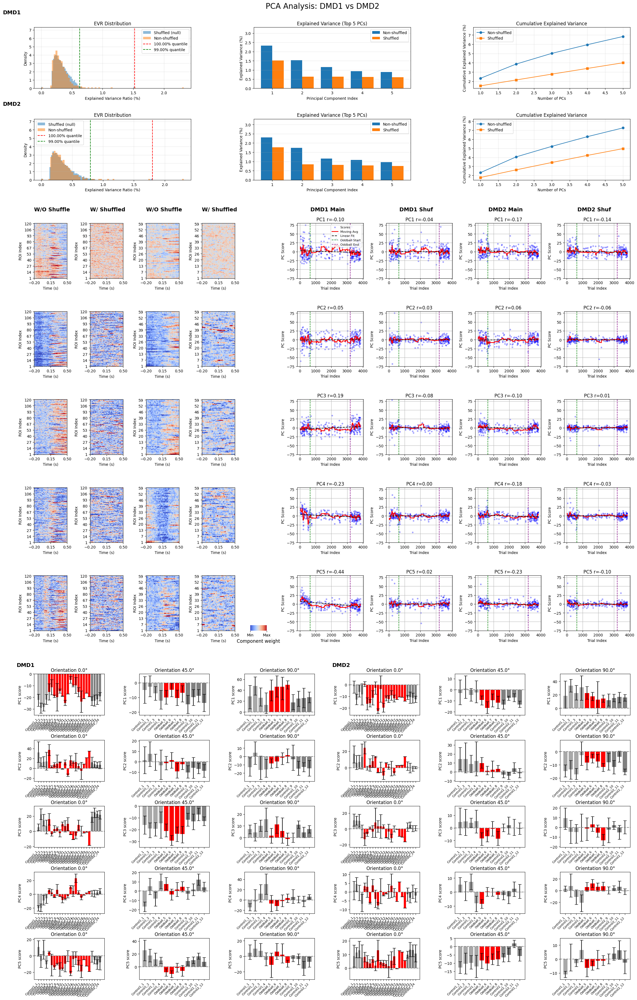

[Saved] _DMD1_2_NewLayout/DMD1_DMD2_summary.png


In [ ]:


plot_all(pca_mod,
    results_all,
    oddball_start_trial,
    oddball_end_trial,
    block_scores_dict1,
    block_scores_dict2,
    n_pcs=N_PC_ploting,
    plot_title='PCA Analysis: DMD1 vs DMD2'
      )

90.0 (34, 140, 120)
0.0 (2247, 140, 120)
45.0 (37, 140, 120)

======== DMD1 ========
Final merged shape (after removing NaN): (2335, 16800)
(2335, 16800)
(2335, 16800)
(2335, 16800)
(2335, 16800)
(2335, 16800)

======== DMD2 ========
Final merged shape (after removing NaN): (2351, 8260)
(2351, 8260)
(2351, 8260)
(2351, 8260)
(2351, 8260)
(2351, 8260)
(34, 140, 59)
(2247, 140, 59)
(37, 140, 59)

======== DMD1 (all PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}

======== DMD2 (all PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
quantile 1 1
quantile 0.99 43
quantile 1 1
quantile 0.99 34
[Unified color range] vmin=-0.0192, vmax=0.0279
[Unified color range] vmin=-0.0243, vmax=0.0469


/tmp/ipython-input-1956800783.py:823: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])  #


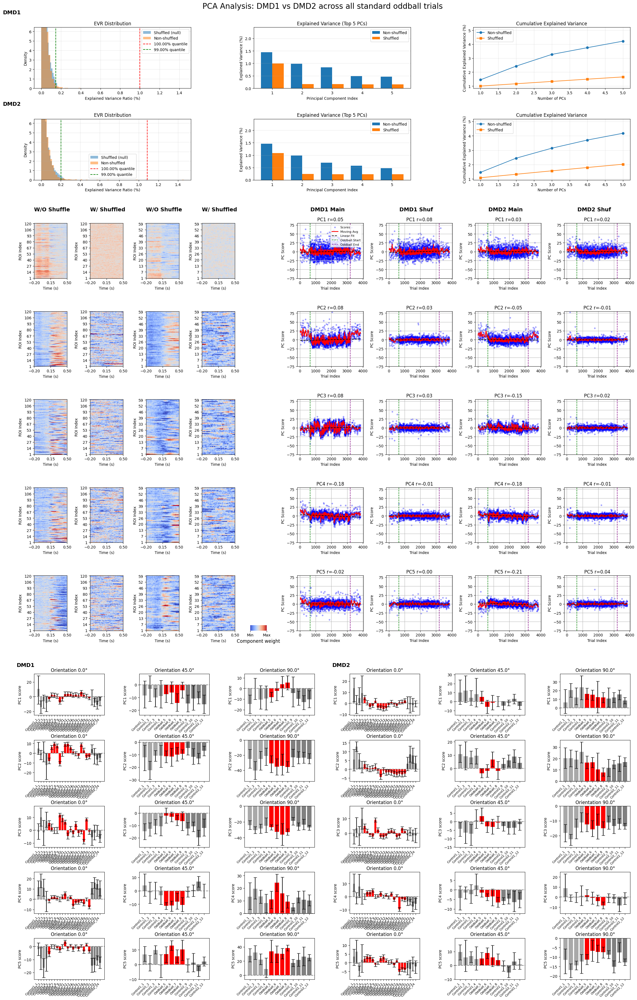

[Saved] _DMD1_2_NewLayout/DMD1_DMD2_summary.png


In [ ]:


# Whether to include **all** standard trials from the oddball blocks
get_all_standard = True


#Whether to perform PCA separately on Control1 / Oddball / Control2,
# or to apply PCA jointly across all blocks

pca_mod = 'all'#'all'  /  sep

shuffle_mode = 'time' #'fll' 'roi'  /  'time

#
N_SHUFFLES = 5
N_PC_ploting= 5
results_all, block_scores_dict1, pca_dict2, pca_scores_dict2, block_scores_dict2 \
                = get_all_results(dff_dmd1,timestamps_dmd1,dff_dmd2,timestamps_dmd2,stim_table,control_1_indices,control_2_indices,oddball_indices,get_all_standard,pca_mod,shuffle_mode,N_SHUFFLES,filename)



plot_all(pca_mod,
    results_all,
    oddball_start_trial,
    oddball_end_trial,
    block_scores_dict1,
    block_scores_dict2,
    n_pcs=N_PC_ploting,
    plot_title='PCA Analysis: DMD1 vs DMD2 across all standard oddball trials'
      )

90.0 (34, 140, 120)
45.0 (37, 140, 120)
0.0 (30, 140, 120)

======== DMD1 ========
(97, 16800)
(97, 16800)
(97, 16800)
(97, 16800)
(97, 16800)
(92, 16800)
(92, 16800)
(92, 16800)
(92, 16800)
(92, 16800)
(108, 16800)
(108, 16800)
(108, 16800)
(108, 16800)
(108, 16800)

======== DMD2 ========
(94, 8260)
(94, 8260)
(94, 8260)
(94, 8260)
(94, 8260)
(90, 8260)
(90, 8260)
(90, 8260)
(90, 8260)
(90, 8260)
(104, 8260)
(104, 8260)
(104, 8260)
(104, 8260)
(104, 8260)
(34, 140, 59)
(37, 140, 59)
(30, 140, 59)

======== DMD1 (sep PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}

======== DMD2 (sep PCA) ========
Orientation 0.0: {'Control1': 4, 'Oddball': 16, 'Control2': 4}
Orientation 45.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
Orientation 90.0: {'Control1': 4, 'Oddball': 4, 'Control2': 4}
=== Drawing PCA set 1 ===
(97, 5)
quantile 1 3
qua

/tmp/ipython-input-70088189.py:198: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 1, 0.96])  #


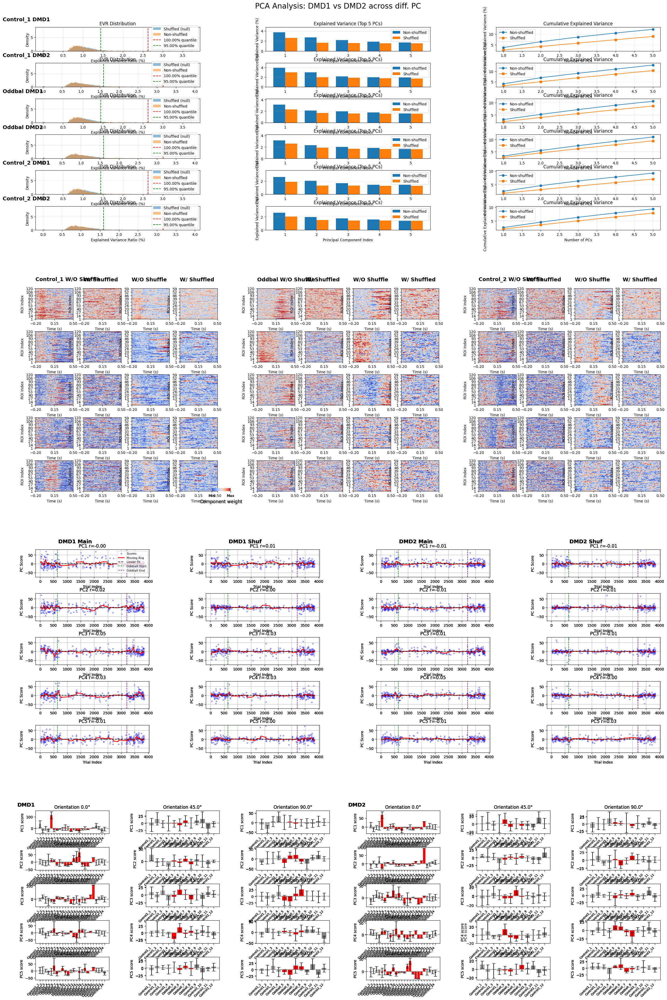

[Saved] sep_DMD1_2_NewLayout/DMD1_DMD2_summary_PCA.png


In [ ]:




# Whether to include **all** standard trials from the oddball blocks
get_all_standard = False


#Whether to perform PCA separately on Control1 / Oddball / Control2,
# or to apply PCA jointly across all blocks
pca_mod = 'sep'#'all'  /  sep

shuffle_mode = 'time' #'fll' 'roi'  /  'time

#
N_SHUFFLES = 5
N_PC_ploting= 5
results_all, block_scores_dict1, pca_dict2, pca_scores_dict2, block_scores_dict2 \
                = get_all_results(dff_dmd1,timestamps_dmd1,dff_dmd2,timestamps_dmd2,stim_table,control_1_indices,control_2_indices,oddball_indices,get_all_standard,pca_mod,shuffle_mode,N_SHUFFLES,filename)



#PCA performed separately control1 oddball control2
plot_all(pca_mod,
    results_all,
    oddball_start_trial,
    oddball_end_trial,
    block_scores_dict1,
    block_scores_dict2,
    n_pcs=N_PC_ploting,
    plot_title='PCA Analysis: DMD1 vs DMD2 across diff. PC'
      )